# Surface Inspection Design Document

Kurra Vishnuvardhan

In [1]:
import os
import json

def count_images_and_labels(image_dir, annotation_file):
    """
    Counts the number of images and their corresponding labels by reading images from a folder
    and matching them with their labels in a COCO-style annotation file. Ensures each image is
    processed only once.

    Args:
        image_dir (str): Path to the directory containing the images.
        annotation_file (str): Path to the COCO-style annotation file containing labels.

    Returns:
        tuple: A tuple containing:
            - total_images (int): Total number of images in the directory.
            - class_counts (dict): Dictionary with counts of images for each class ("Rough" and "Smooth").
    """
    with open(annotation_file, 'r') as f:
        annotations = json.load(f)
    
    annotation_lookup = {}
    for ann in annotations['annotations']:
        image_id = ann['image_id']
        category_id = ann['category_id']
        
        if image_id not in annotation_lookup:
            annotation_lookup[image_id] = []
        annotation_lookup[image_id].append(category_id)
    
    class_counts = {"Rough": 0, "Smooth": 0}
    
    total_images = 0
    
    for image_filename in os.listdir(image_dir):
        if not image_filename.endswith(('.jpg', '.png', '.jpeg')):
            continue
        
        total_images += 1
        
        image_id = None
        for img in annotations['images']:
            if img['file_name'] == image_filename:
                image_id = img['id']
                break
        
        if image_id is None:
            continue
        
        if image_id in annotation_lookup:
            category_ids = annotation_lookup[image_id]
            
            has_rough = False
            has_smooth = False
            
            for category_id in category_ids:
                if category_id == 1 and not has_rough:
                    class_counts["Rough"] += 1
                    has_rough = True
                elif category_id == 2 and not has_smooth:
                    class_counts["Smooth"] += 1
                    has_smooth = True
    
    return total_images, class_counts


base_dir = '/kaggle/input/wall-dataset'

train_image_dir = os.path.join(base_dir, 'train')
train_annotation_file = os.path.join(base_dir, 'train/_annotations.coco.json')

val_image_dir = os.path.join(base_dir, 'valid')
val_annotation_file = os.path.join(base_dir, 'valid/_annotations.coco.json')

test_image_dir = os.path.join(base_dir, 'test')
test_annotation_file = os.path.join(base_dir, 'test/_annotations.coco.json')

train_total, train_class_counts = count_images_and_labels(train_image_dir, train_annotation_file)
val_total, val_class_counts = count_images_and_labels(val_image_dir, val_annotation_file)
test_total, test_class_counts = count_images_and_labels(test_image_dir, test_annotation_file)

print("Train Dataset:")
print(f"Total Images: {train_total}")
print(f"Class Counts: {train_class_counts}")

print("\nValidation Dataset:")
print(f"Total Images: {val_total}")
print(f"Class Counts: {val_class_counts}")

print("\nTest Dataset:")
print(f"Total Images: {test_total}")
print(f"Class Counts: {test_class_counts}")

Train Dataset:
Total Images: 568
Class Counts: {'Rough': 396, 'Smooth': 231}

Validation Dataset:
Total Images: 53
Class Counts: {'Rough': 38, 'Smooth': 18}

Test Dataset:
Total Images: 27
Class Counts: {'Rough': 17, 'Smooth': 11}


## Train
The train dataset is the largest, with 568 images.

There is a significant imbalance between the two classes:

The "Rough" class has 396 images, making up approximately 69.7% of the dataset.

The "Smooth" class has 231 images, making up approximately 30.3% of the dataset.

This imbalance could affect the model's ability to generalize, especially for the "Smooth" class, which is underrepresented.

## Validate
The validation dataset is much smaller, with only 53 images.

The class imbalance persists:

The "Rough" class has 38 images, making up approximately 71.7% of the dataset.

The "Smooth" class has 18 images, making up approximately 28.3% of the dataset.

The small size of the validation dataset may make it less reliable for evaluating model performance during training.
## Test
The test dataset is the smallest, with only 27 images.

The class imbalance is still present but less pronounced:

The "Rough" class has 17 images, making up approximately 63% of the dataset.

The "Smooth" class has 11 images, making up approximately 37% of the dataset.

The small size of the test dataset may limit the ability to draw statistically significant conclusions about the model's performance.

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 88.7MB/s]


Epoch 1: Train Loss 0.0399, Train Acc 70.96%, Val Loss 0.0578, Val Acc 84.31%
Epoch 2: Train Loss 0.0258, Train Acc 84.74%, Val Loss 0.0202, Val Acc 90.20%
Epoch 3: Train Loss 0.0191, Train Acc 88.79%, Val Loss 0.0196, Val Acc 90.20%
Epoch 4: Train Loss 0.0172, Train Acc 90.62%, Val Loss 0.0195, Val Acc 86.27%
Epoch 5: Train Loss 0.0143, Train Acc 91.91%, Val Loss 0.0294, Val Acc 90.20%
Epoch 6: Train Loss 0.0158, Train Acc 92.10%, Val Loss 0.0390, Val Acc 90.20%
Epoch 7: Train Loss 0.0113, Train Acc 94.30%, Val Loss 0.0290, Val Acc 90.20%
Epoch 8: Train Loss 0.0136, Train Acc 92.65%, Val Loss 0.0357, Val Acc 88.24%
Epoch 9: Train Loss 0.0123, Train Acc 93.57%, Val Loss 0.0297, Val Acc 90.20%
Epoch 10: Train Loss 0.0096, Train Acc 95.96%, Val Loss 0.0252, Val Acc 90.20%
Epoch 11: Train Loss 0.0074, Train Acc 96.51%, Val Loss 0.0322, Val Acc 90.20%
Epoch 12: Train Loss 0.0109, Train Acc 95.96%, Val Loss 0.0395, Val Acc 88.24%
Epoch 13: Train Loss 0.0082, Train Acc 96.14%, Val Loss 0.040

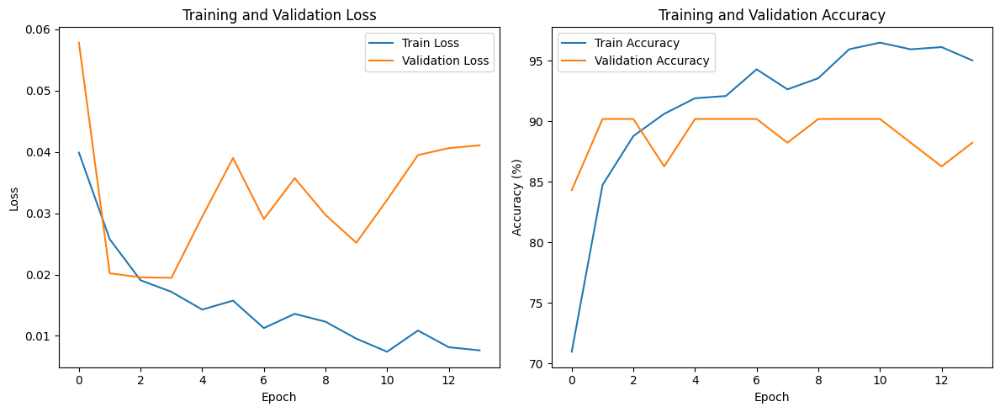

Test Accuracy: 92.31%
              precision    recall  f1-score   support

  Rough wall       1.00      0.87      0.93        15
 Smooth wall       0.85      1.00      0.92        11

    accuracy                           0.92        26
   macro avg       0.92      0.93      0.92        26
weighted avg       0.93      0.92      0.92        26



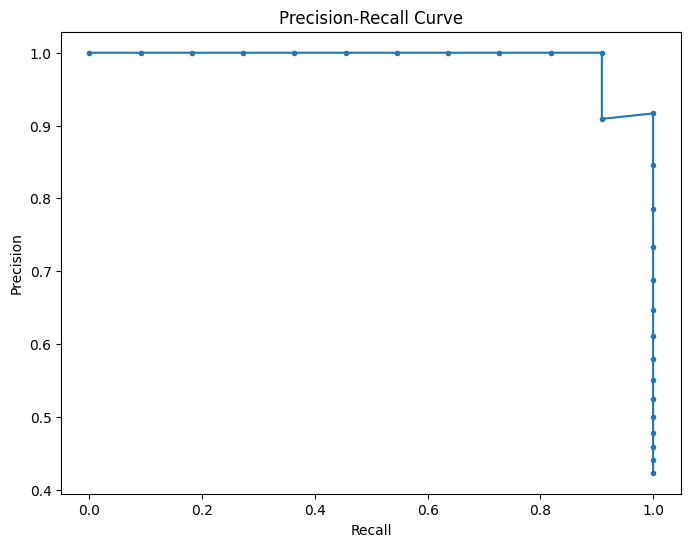

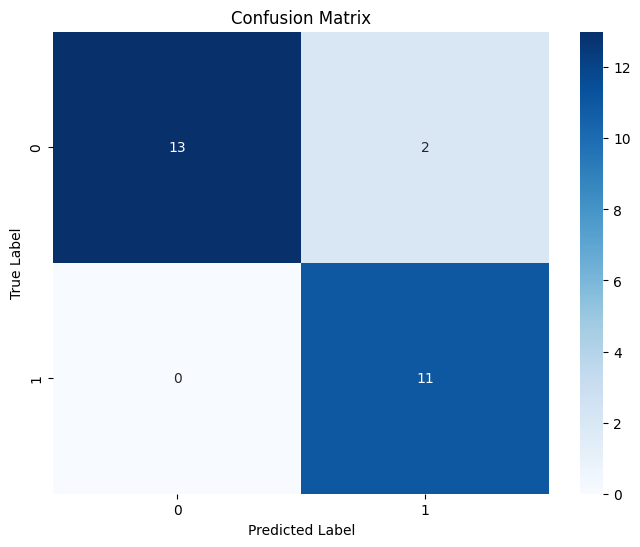

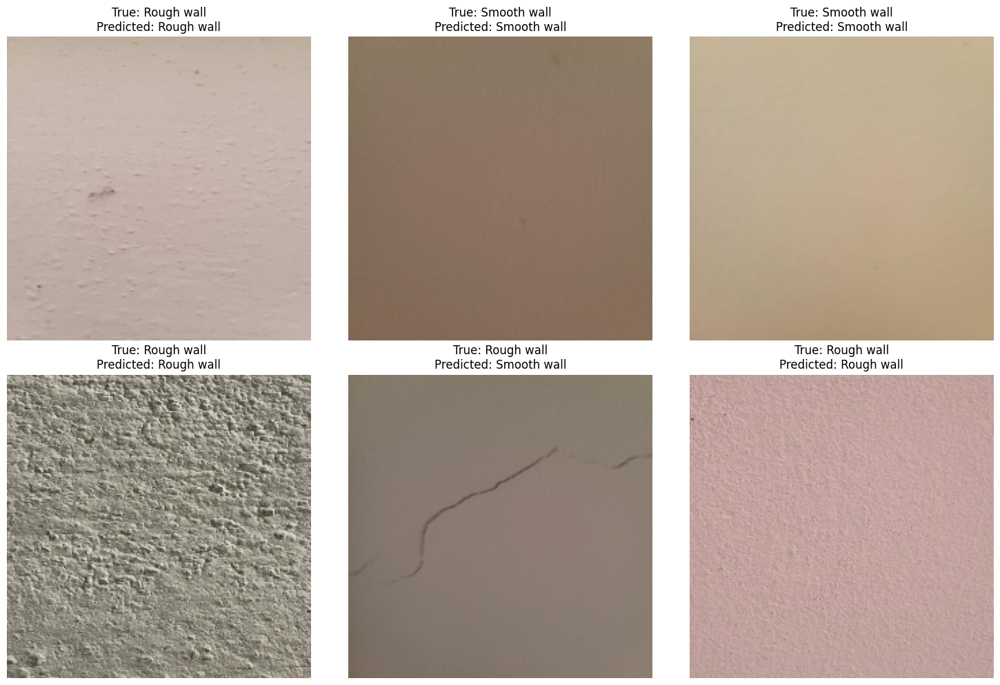

In [18]:
import os
import json
import cv2
import numpy as np
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, confusion_matrix, classification_report
import seaborn as sns

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Custom Focal Loss to handle class imbalance
class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha  # Weight for the positive class
        self.gamma = gamma  # Focusing parameter
        self.reduction = reduction  # Loss reduction method

    def forward(self, inputs, targets):
        ce_loss = nn.functional.cross_entropy(inputs, targets, reduction='none')  # Cross-entropy loss
        pt = torch.exp(-ce_loss)  # Probability of the true class
        focal_loss = self.alpha * (1 - pt) ** self.gamma * ce_loss  # Focal loss calculation

        if self.reduction == 'mean':
            return focal_loss.mean()  # Return mean loss
        elif self.reduction == 'sum':
            return focal_loss.sum()  # Return sum of losses
        return focal_loss

# Custom Dataset Class for Wall Surface Images
class WallSurfaceDataset(Dataset):
    def __init__(self, image_dir, annotation_file, transform=None):
        self.image_dir = image_dir  # Directory containing images
        self.annotations = json.load(open(annotation_file, 'r'))  # Load COCO-style annotations
        self.image_info = {img['id']: img['file_name'] for img in self.annotations['images']}  # Map image IDs to filenames
        self.transform = transform  # Image transformations
        self.class_names = {0: "Rough wall", 1: "Smooth wall"}  # Class names mapping

        # Group annotations by image ID
        self.image_annotations = {}
        for ann in self.annotations['annotations']:
            if ann['category_id'] in [1, 2]:  # Only consider relevant categories
                if ann['image_id'] not in self.image_annotations:
                    self.image_annotations[ann['image_id']] = []
                self.image_annotations[ann['image_id']].append(ann)

        # List of unique image IDs
        self.image_ids = list(self.image_annotations.keys())

    def __len__(self):
        return len(self.image_ids)  # Total number of images

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        annotations = self.image_annotations[image_id]
        image_path = os.path.join(self.image_dir, self.image_info[image_id])

        # Load and preprocess the image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_resized = cv2.resize(image, (224, 224))  # Resize to model input size

        # Assign label: 1 for Rough, 0 for Smooth
        label = 1 if any(ann['category_id'] == 2 for ann in annotations) else 0

        # Apply transformations if provided
        if self.transform:
            image_resized = self.transform(image_resized)

        return image_resized, label

# Custom Model Class using ResNet18 as backbone
class WallSurfaceNet(nn.Module):
    def __init__(self, num_classes=2):
        super().__init__()
        # Load pretrained ResNet18
        resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

        # Freeze initial layers
        for param in resnet.parameters():
            param.requires_grad = False

        # Unfreeze later layers for fine-tuning
        for param in list(resnet.parameters())[-20:]:
            param.requires_grad = True

        # Feature extractor
        self.features = nn.Sequential(*list(resnet.children())[:-1])

        # Custom classifier with regularization
        self.classifier = nn.Sequential(
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        features = self.features(x)
        features = features.view(features.size(0), -1)
        return self.classifier(features)

# Function to plot training and validation metrics
def plot_training_metrics(train_losses, val_losses, train_accuracies, val_accuracies):
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(train_accuracies, label='Train Accuracy')
    plt.plot(val_accuracies, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Function to plot precision-recall curve
def plot_precision_recall(y_true, y_pred_proba):
    precision, recall, _ = precision_recall_curve(y_true, y_pred_proba)

    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, marker='.')
    plt.title('Precision-Recall Curve')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.show()

# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

# Function to visualize model predictions
def visualize_predictions(model, dataset, class_names, num_images=6):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()

    plt.figure(figsize=(15, 10))
    np.random.seed(42)
    random_indices = np.random.choice(len(dataset), num_images, replace=False)

    for i, idx in enumerate(random_indices, 1):
        image, true_label = dataset[idx]
        image_for_display = image.permute(1, 2, 0).numpy()
        image_for_display = image_for_display * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]
        image_for_display = np.clip(image_for_display, 0, 1)

        with torch.no_grad():
            pred_logits = model(image.unsqueeze(0).to(device))
            pred_label = torch.argmax(pred_logits, dim=1).cpu().item()

        plt.subplot(2, 3, i)
        plt.imshow(image_for_display)
        plt.title(f'True: {class_names[true_label]}\nPredicted: {class_names[pred_label]}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Function to train and evaluate the model
def train_and_evaluate(train_dataset, val_dataset, test_dataset):
    # Data augmentation for training
    train_transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.RandomRotation(20),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    # Transformations for validation and testing
    test_transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    # Apply transformations to datasets
    train_dataset.transform = train_transform
    val_dataset.transform = test_transform
    test_dataset.transform = test_transform

    # Data loaders
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, drop_last=True)
    val_loader = DataLoader(val_dataset, batch_size=32)
    test_loader = DataLoader(test_dataset, batch_size=32)

    # Device setup (GPU if available)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = WallSurfaceNet().to(device)

    # Optimizer with weight decay
    optimizer = optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
    criterion = FocalLoss(alpha=0.25, gamma=2.0)  # Focal loss for class imbalance
    scheduler = ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5)  # Learning rate scheduler

    # Track metrics
    train_losses_list, val_losses_list = [], []
    train_accuracies_list, val_accuracies_list = [], []

    best_val_loss = float('inf')
    epochs_no_improve = 0
    max_epochs_no_improve = 10

    # Training loop
    for epoch in range(100):
        model.train()
        train_losses, train_correct, train_total = [], 0, 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_losses.append(loss.item())
            _, predicted = torch.max(outputs, 1)
            train_total += labels.size(0)
            train_correct += (predicted == labels).sum().item()

        # Validation
        model.eval()
        val_losses, val_correct, val_total = [], 0, 0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_losses.append(loss.item())

                _, predicted = torch.max(outputs, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        # Calculate metrics
        train_loss = np.mean(train_losses)
        val_loss = np.mean(val_losses)
        train_acc = 100 * train_correct / train_total
        val_acc = 100 * val_correct / val_total

        # Store metrics
        train_losses_list.append(train_loss)
        val_losses_list.append(val_loss)
        train_accuracies_list.append(train_acc)
        val_accuracies_list.append(val_acc)

        print(f"Epoch {epoch+1}: Train Loss {train_loss:.4f}, Train Acc {train_acc:.2f}%, Val Loss {val_loss:.4f}, Val Acc {val_acc:.2f}%")

        # Adjust learning rate
        scheduler.step(val_loss)

        # Early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_no_improve = 0
            torch.save(model.state_dict(), 'best_model.pth')  # Save best model
        else:
            epochs_no_improve += 1

        if epochs_no_improve >= max_epochs_no_improve:
            print("Early stopping triggered")
            break

    # Plot training metrics
    plot_training_metrics(train_losses_list, val_losses_list, train_accuracies_list, val_accuracies_list)

    # Testing
    model.load_state_dict(torch.load('best_model.pth'))  # Load best model
    model.eval()

    # Collect true labels and predictions
    y_true_test, y_pred_test, y_pred_proba_test = [], [], []
    test_correct, test_total = 0, 0

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probas = torch.softmax(outputs, dim=1)
            _, predicted = torch.max(outputs, 1)

            test_total += labels.size(0)
            test_correct += (predicted == labels).sum().item()

            y_true_test.extend(labels.cpu().numpy())
            y_pred_test.extend(predicted.cpu().numpy())
            y_pred_proba_test.extend(probas[:, 1].cpu().numpy())

    # Print test accuracy and classification report
    test_acc = 100 * test_correct / test_total
    print(f"Test Accuracy: {test_acc:.2f}%")
    print(classification_report(y_true_test, y_pred_test, target_names=['Rough wall', 'Smooth wall']))

    # Plot evaluation metrics
    plot_precision_recall(y_true_test, y_pred_proba_test)
    plot_confusion_matrix(y_true_test, y_pred_test)

    # Visualize predictions
    visualize_predictions(model, test_dataset, test_dataset.class_names)

    return model  # Return the trained model

# Dataset paths
base_dir = '/kaggle/input/wall-dataset'

train_dataset = WallSurfaceDataset(
    image_dir=os.path.join(base_dir, 'train'),
    annotation_file=os.path.join(base_dir, 'train/_annotations.coco.json')
)

val_dataset = WallSurfaceDataset(
    image_dir=os.path.join(base_dir, 'valid'),
    annotation_file=os.path.join(base_dir, 'valid/_annotations.coco.json')
)

test_dataset = WallSurfaceDataset(
    image_dir=os.path.join(base_dir, 'test'),
    annotation_file=os.path.join(base_dir, 'test/_annotations.coco.json')
)

# Train and evaluate the model
trained_model = train_and_evaluate(train_dataset, val_dataset, test_dataset)

There is no problem of false positive or false negative, And Area under precision recall curve is very high, that means it is a good classification model

In [19]:
import os
import json
import cv2
import numpy as np
import pandas as pd
from scipy.stats import gaussian_kde
import seaborn as sns
import matplotlib.pyplot as plt
from skimage.feature import graycomatrix, graycoprops
from skimage.measure import shannon_entropy

# Define paths to the dataset
base_dir = '/kaggle/input/wall-dataset'
image_dir = os.path.join(base_dir, 'train')  # Directory containing training images
annotation_file = os.path.join(base_dir, 'train/_annotations.coco.json')  # Path to COCO-style annotations

# Load annotations from the JSON file
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

# Function to calculate metrics for a given image
def calculate_metrics(image):
    """
    Computes various metrics for an image to quantify its texture and smoothness.

    Args:
        image (numpy.ndarray): Input image in RGB format.

    Returns:
        dict: A dictionary containing computed metrics such as edge density, surface roughness, etc.
    """
    # Convert the image to grayscale for texture analysis
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Edge density: Measure the density of edges using Canny edge detection
    edges = cv2.Canny(gray, 100, 200)
    edge_density = np.sum(edges) / (image.shape[0] * image.shape[1])

    # Surface roughness: Standard deviation of pixel intensities
    surface_roughness = np.std(gray)

    # Contour complexity: Number of contours detected in the edge map
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour_complexity = len(contours)

    # GLCM (Gray-Level Co-occurrence Matrix) features
    glcm = graycomatrix(gray, distances=[1], angles=[0], symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast')[0, 0]  # Contrast in texture
    homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]  # Homogeneity in texture
    energy = graycoprops(glcm, 'energy')[0, 0]  # Energy in texture

    # Gradient magnitude: Average magnitude of gradients using Sobel operator
    grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2).mean()

    # Entropy: Measure of randomness in pixel intensities
    entropy = shannon_entropy(gray)

    # Return all computed metrics as a dictionary
    return {
        'edge_density': edge_density,
        'surface_roughness': surface_roughness,
        'contour_complexity': contour_complexity,
        'contrast': contrast,
        'homogeneity': homogeneity,
        'energy': energy,
        'gradient_magnitude': gradient_magnitude,
        'entropy': entropy
    }

# Create lookup dictionaries for images and annotations
image_lookup = {img['id']: img['file_name'] for img in annotations['images']}  # Map image IDs to filenames
annotation_lookup = {}  # Map image IDs to their corresponding annotations
for ann in annotations['annotations']:
    if ann['category_id'] in [1, 2]:  # Only include Rough Wall (1) and Smooth Wall (2)
        if ann['image_id'] not in annotation_lookup:
            annotation_lookup[ann['image_id']] = []
        annotation_lookup[ann['image_id']].append(ann['category_id'])

# Prepare the dataset by computing metrics for each image
data = []
for image_id, categories in annotation_lookup.items():
    # Assign label: 0 for Rough, 1 for Smooth
    label = 0 if 2 in categories else 1  # 2 is Rough Wall

    # Get the image filename and load the image
    image_filename = image_lookup[image_id]
    image_path = os.path.join(image_dir, image_filename)
    image = cv2.imread(image_path)
    if image is None:
        print(f"Failed to read image: {image_path}. Skipping.")
        continue

    # Convert the image to RGB and resize it
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_resized = cv2.resize(image, (224, 224))

    # Compute metrics for the resized image
    metrics = calculate_metrics(image_resized)

    # Append the metrics and label to the dataset
    data.append(list(metrics.values()) + [label])

# Create a DataFrame from the computed metrics and labels
feature_names = [
    'edge_density', 'surface_roughness', 'contour_complexity',
    'contrast', 'homogeneity', 'energy', 'gradient_magnitude', 'entropy'
]
metrics_df = pd.DataFrame(data, columns=feature_names + ['label'])

# Display the first few rows of the DataFrame
print(metrics_df.head())

   edge_density  surface_roughness  contour_complexity    contrast  \
0      3.679448          38.979436                   7   68.059437   
1      2.093830          38.767027                   4   92.062540   
2     23.296397          12.718013                 288  168.019098   
3      2.048091          54.568912                   5  119.193966   
4      1.982023          50.029432                   4   94.729721   

   homogeneity    energy  gradient_magnitude   entropy  label  
0     0.637629  0.105215           14.301619  5.771150      1  
1     0.871268  0.144514           13.352954  5.283325      0  
2     0.098711  0.025170           60.079233  5.678793      1  
3     0.717599  0.151783           16.947644  4.386353      1  
4     0.766373  0.164698           14.629420  4.412842      0  


These metrices will be used to calculate smoothness score

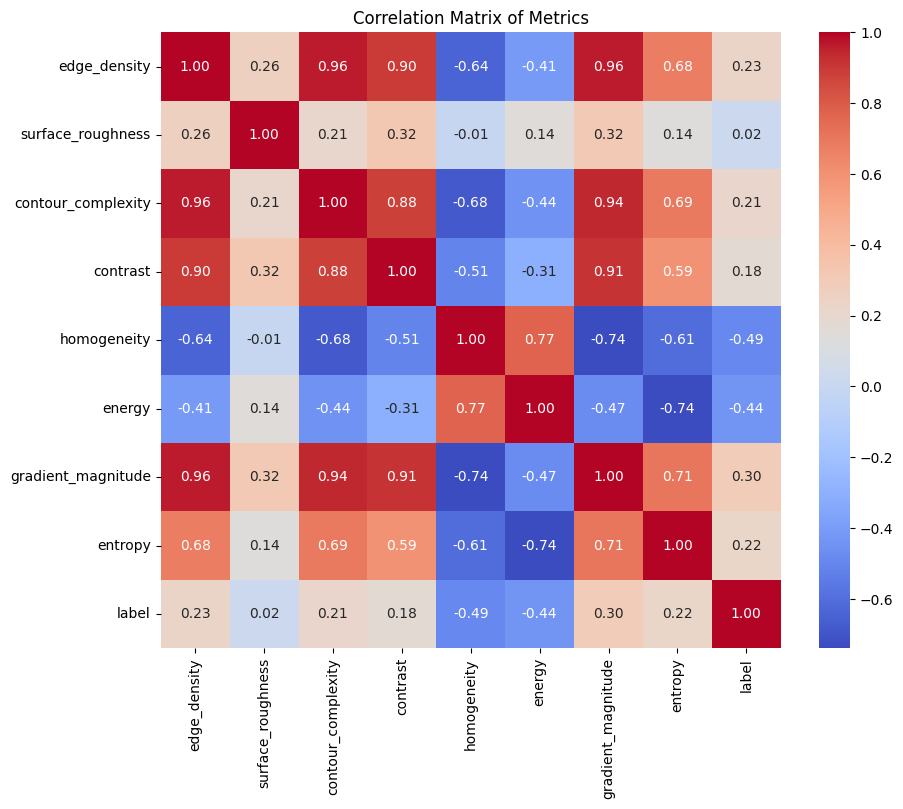

In [4]:
# Compute the correlation matrix to understand relationships between features and the target label
corr_matrix = metrics_df.corr()  # Calculate pairwise correlation of columns

# Plot the correlation matrix using a heatmap for better visualization
plt.figure(figsize=(10, 8))  # Set the figure size
sns.heatmap(
    corr_matrix,  # Input correlation matrix
    annot=True,  # Annotate each cell with the correlation value
    cmap='coolwarm',  # Use a color map that highlights positive and negative correlations
    fmt='.2f'  # Format the annotations to two decimal places
)
plt.title('Correlation Matrix of Metrics')  # Add a title to the plot
plt.show()  # Display the plot

This is a correlation matrix, if correlation between any two values is high means they increase redundant information. When two metrics are highly correlated meaning they are very similar, if not removed it can overfit the model.

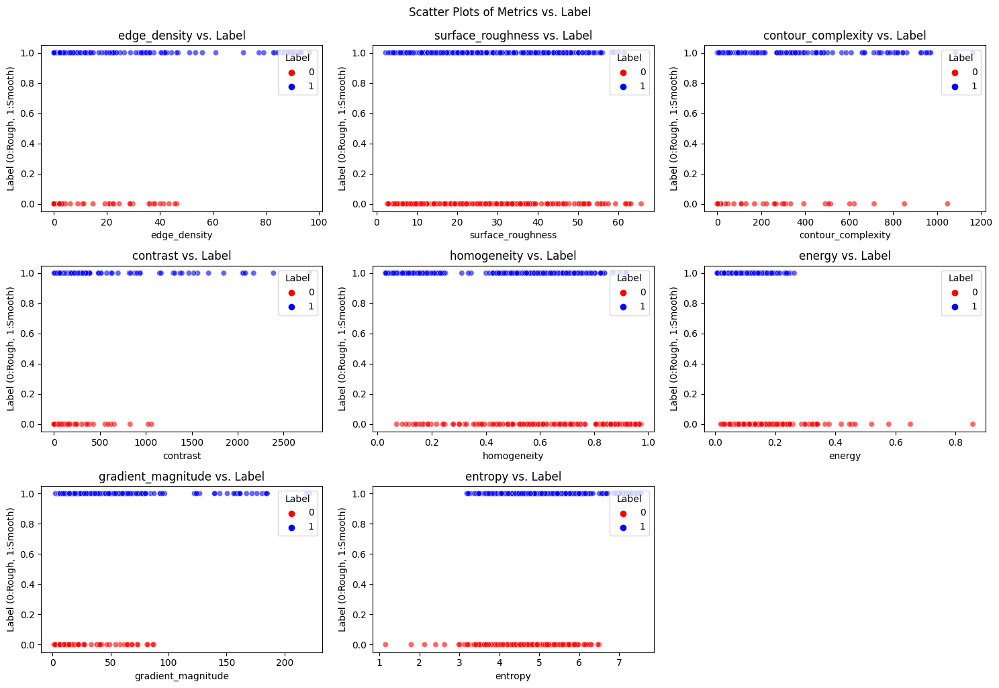

In [6]:
plt.close('all')  # Close all existing figures
plt.figure(figsize=(15, 10))  # Set the figure size to accommodate multiple subplots

# Loop through each metric and create a scatter plot
for i, metric in enumerate(feature_names):
    plt.subplot(3, 3, i + 1)  # Create a 3x3 grid of subplots
    sns.scatterplot(
        x=metrics_df[metric],  # Metric values on the x-axis
        y=metrics_df['label'],  # Label values on the y-axis
        hue=metrics_df['label'],  # Color points based on the label
        palette={0: 'red', 1: 'blue'},  # Use red for Rough (0) and blue for Smooth (1)
        alpha=0.6  # Set transparency for better visibility of overlapping points
    )
    plt.title(f'{metric} vs. Label')  # Add a title to the subplot
    plt.xlabel(metric)  # Label the x-axis with the metric name
    plt.ylabel('Label (0:Rough, 1:Smooth)')  # Label the y-axis
    plt.legend(title='Label', loc='upper right')  # Add a legend for the labels

plt.tight_layout()  # Adjust spacing between subplots for better readability
plt.suptitle('Scatter Plots of Metrics vs. Label', y=1.02)  # Add a main title for the entire figure
plt.show()  # Display the plot

All metrics are overlaping the labels. This means it is hard to classify.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

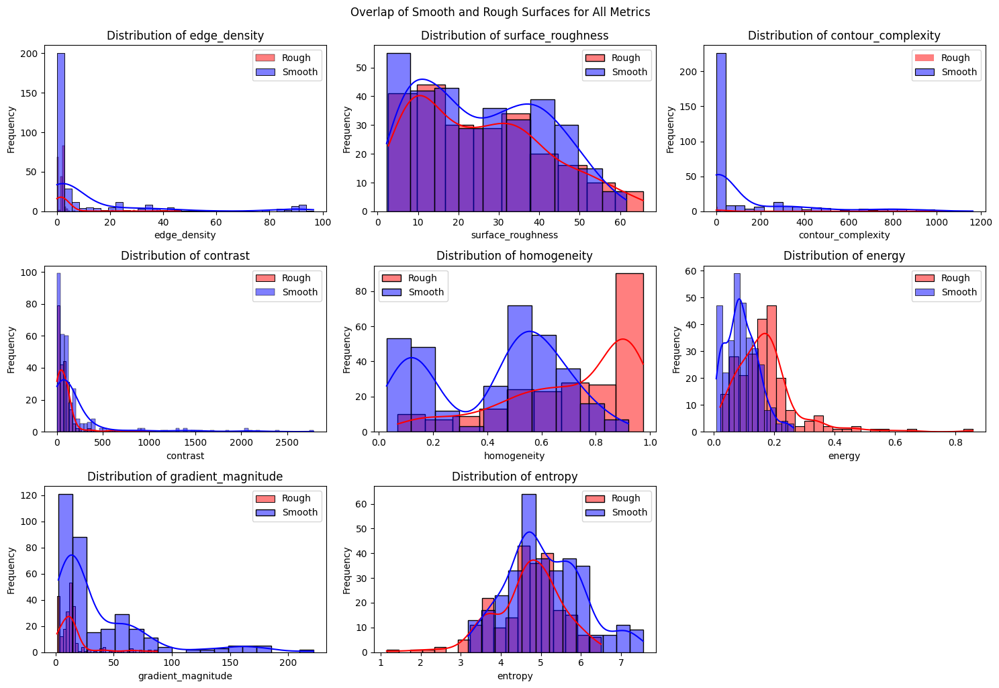

In [7]:
# Plot histograms with KDE (Kernel Density Estimation) for each metric to compare distributions
plt.figure(figsize=(15, 10))  # Set the figure size to accommodate multiple subplots

# Loop through each metric and create a histogram with KDE
for i, metric in enumerate(feature_names):
    plt.subplot(3, 3, i + 1)  # Create a 3x3 grid of subplots
    sns.histplot(
        metrics_df[metrics_df['label'] == 0][metric],  # Data for Rough surfaces (label=0)
        color='red',  # Use red for Rough surfaces
        label='Rough',  # Label for Rough surfaces
        kde=True  # Add Kernel Density Estimation (KDE) for smooth distribution
    )
    sns.histplot(
        metrics_df[metrics_df['label'] == 1][metric],  # Data for Smooth surfaces (label=1)
        color='blue',  # Use blue for Smooth surfaces
        label='Smooth',  # Label for Smooth surfaces
        kde=True  # Add Kernel Density Estimation (KDE) for smooth distribution
    )
    plt.title(f'Distribution of {metric}')  # Add a title to the subplot
    plt.xlabel(metric)  # Label the x-axis with the metric name
    plt.ylabel('Frequency')  # Label the y-axis
    plt.legend()  # Add a legend to distinguish between Rough and Smooth

plt.tight_layout()  # Adjust spacing between subplots for better readability
plt.suptitle('Overlap of Smooth and Rough Surfaces for All Metrics', y=1.02)  # Add a main title for the entire figure
plt.show()  # Display the plot

Only Homogeneity and energy have different peaks for labels, others are just overlaping.

In [8]:
# Function to calculate the overlap between two distributions using KDE (Kernel Density Estimation)
def calculate_overlap(data1, data2):
    """
    Calculates the overlap area between two distributions using Gaussian KDE.

    Args:
        data1 (array-like): Data for the first distribution.
        data2 (array-like): Data for the second distribution.

    Returns:
        float: The overlap area between the two distributions.
    """
    # Create KDE (Kernel Density Estimation) for both datasets
    kde1 = gaussian_kde(data1)  # KDE for the first distribution
    kde2 = gaussian_kde(data2)  # KDE for the second distribution

    # Define the range for the x-axis
    x_min = min(data1.min(), data2.min())  # Minimum value across both datasets
    x_max = max(data1.max(), data2.max())  # Maximum value across both datasets
    x = np.linspace(x_min, x_max, 1000)  # Create 1000 points between x_min and x_max

    # Evaluate KDEs at the x points
    y1 = kde1(x)  # KDE values for the first distribution
    y2 = kde2(x)  # KDE values for the second distribution

    # Calculate the intersection of the two KDEs
    intersection = np.minimum(y1, y2)  # Minimum of the two KDEs at each point

    # Compute the overlap area using numerical integration
    overlap = np.trapz(intersection, x)  # Integrate the intersection area
    return overlap

# Calculate overlap for each metric between Rough and Smooth surfaces
overlap_scores = {}  # Dictionary to store overlap scores for each metric
for metric in feature_names:
    rough_data = metrics_df[metrics_df['label'] == 0][metric]  # Data for Rough surfaces
    smooth_data = metrics_df[metrics_df['label'] == 1][metric]  # Data for Smooth surfaces
    overlap = calculate_overlap(rough_data, smooth_data)  # Calculate overlap
    overlap_scores[metric] = overlap  # Store the overlap score for the metric

# Print overlap scores
print("Overlap Scores Between Smooth and Rough Surfaces:")
for metric, overlap in overlap_scores.items():
    print(f"{metric}: {overlap:.4f}")  # Print each metric's overlap score with 4 decimal places

Overlap Scores Between Smooth and Rough Surfaces:
edge_density: 0.3876
surface_roughness: 0.8946
contour_complexity: 0.4085
contrast: 0.5051
homogeneity: 0.5397
energy: 0.5801
gradient_magnitude: 0.5182
entropy: 0.8310


Based on the above plots and graphs, I am only selecting edge_density, gradient_magnitude, entropy and homogeneity to calculate my smoothness score.

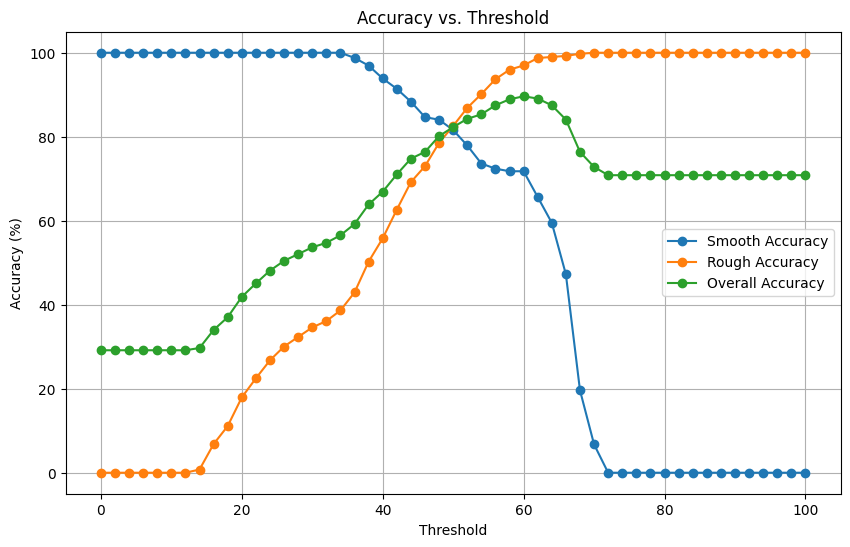

In [9]:
import os
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Define paths to the dataset
base_dir = '/kaggle/input/wall-dataset'
image_dir = os.path.join(base_dir, 'train')  # Directory containing training images
annotation_file = os.path.join(base_dir, 'train/_annotations.coco.json')  # Path to COCO-style annotations

# Load annotations from the JSON file
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

# Create lookup dictionaries for images and annotations
image_lookup = {img['file_name']: img['id'] for img in annotations['images']}  # Map filenames to image IDs
annotation_lookup = {}  # Map image IDs to their corresponding annotations
for ann in annotations['annotations']:
    if ann['category_id'] in [1, 2]:  # Only include Rough Wall (1) and Smooth Wall (2)
        if ann['image_id'] not in annotation_lookup:
            annotation_lookup[ann['image_id']] = set()
        annotation_lookup[ann['image_id']].add(ann['category_id'])

# Prepare the dataset by computing smoothness scores and labels
data = []
for image_filename in os.listdir(image_dir):
    # Skip non-image files
    if not image_filename.endswith(('.jpg', '.png', '.jpeg')):
        continue
    
    image_path = os.path.join(image_dir, image_filename)
    
    # Skip images not found in the annotations
    if image_filename not in image_lookup:
        continue
    
    image_id = image_lookup[image_filename]
    
    # Skip images without relevant annotations (Rough or Smooth)
    if image_id not in annotation_lookup:
        continue
    
    # Label mapping: Smooth Wall (2) -> 1, Rough Wall (1) -> 0
    actual_label = 0 if 1 in annotation_lookup[image_id] else 1
    
    # Load and preprocess the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_resized = cv2.resize(image, (224, 224))  # Resize to a fixed size
    
    # Compute metrics for the image
    metrics = calculate_metrics(image_resized)
    
    # Combine metrics into a single smoothness score using weighted contributions
    smoothness_score = (
        0.088 * metrics['edge_density'] +  # Edge density (lower is better)
        0.708 * metrics['homogeneity'] * 100 +  # Homogeneity (higher is better)
        0.067 * metrics['gradient_magnitude'] +  # Gradient magnitude (lower is better)
        0.433 * metrics['entropy']  # Entropy (lower is better)
    )
    
    # Append the smoothness score and actual label to the dataset
    data.append([smoothness_score, actual_label])

# Convert the dataset to a DataFrame
df = pd.DataFrame(data, columns=['smoothness_score', 'actual_label'])

# Evaluate accuracy for different thresholds
thresholds = np.arange(0, 101, 2)  # Thresholds from 0 to 100 in steps of 2
smooth_accuracies = []  # Accuracy for Smooth surfaces
rough_accuracies = []  # Accuracy for Rough surfaces
overall_accuracies = []  # Overall accuracy

for threshold in thresholds:
    # Predict labels based on the threshold
    df['predicted_label'] = (df['smoothness_score'] > threshold).astype(int)
    
    # Calculate overall accuracy
    correct_predictions = (df['predicted_label'] == df['actual_label']).sum()
    total_images = len(df)
    overall_accuracy = (correct_predictions / total_images) * 100
    
    # Calculate accuracy for Smooth surfaces
    good_total = (df['actual_label'] == 1).sum()
    good_correct = ((df['actual_label'] == 1) & (df['predicted_label'] == 1)).sum()
    good_accuracy = (good_correct / good_total) * 100 if good_total > 0 else 0
    
    # Calculate accuracy for Rough surfaces
    poor_total = (df['actual_label'] == 0).sum()
    poor_correct = ((df['actual_label'] == 0) & (df['predicted_label'] == 0)).sum()
    poor_accuracy = (poor_correct / poor_total) * 100 if poor_total > 0 else 0
    
    # Store accuracies
    smooth_accuracies.append(good_accuracy)
    rough_accuracies.append(poor_accuracy)
    overall_accuracies.append(overall_accuracy)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(thresholds, smooth_accuracies, label='Smooth Accuracy', marker='o')
plt.plot(thresholds, rough_accuracies, label='Rough Accuracy', marker='o')
plt.plot(thresholds, overall_accuracies, label='Overall Accuracy', marker='o')
plt.xlabel('Threshold')
plt.ylabel('Accuracy (%)')
plt.title('Accuracy vs. Threshold')
plt.legend()
plt.grid(True)
plt.show()

This graph illustrates how accuracy changes as the smoothness score threshold varies. The optimal threshold, where accuracy is highest, is 60.

In [22]:
import os
import json
import cv2
import numpy as np
from sklearn.ensemble import RandomForestClassifier

# Define paths to the dataset
base_dir = '/kaggle/input/wall-dataset'
image_dir = os.path.join(base_dir, 'train')  # Directory containing training images
annotation_file = os.path.join(base_dir, 'train/_annotations.coco.json')  # Path to COCO-style annotations

# Load annotations from the JSON file
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

# Create lookup dictionaries for images and annotations
image_lookup = {img['file_name']: img['id'] for img in annotations['images']}  # Map filenames to image IDs
annotation_lookup = {
    ann['image_id']: ann['category_id'] 
    for ann in annotations['annotations'] 
    if ann['category_id'] in [1, 2]  # Only include Rough Wall (1) and Smooth Wall (2)
}

# Prepare the dataset for training
X = []  # Features (metrics)
y = []  # Labels (0 for Rough, 1 for Smooth)

for image_filename in os.listdir(image_dir):
    # Skip non-image files
    if not image_filename.endswith(('.jpg', '.png', '.jpeg')):
        continue
    
    image_path = os.path.join(image_dir, image_filename)
    
    # Skip images not found in the annotations
    if image_filename not in image_lookup:
        continue
    
    image_id = image_lookup[image_filename]
    
    # Skip images without relevant annotations (Rough or Smooth)
    if image_id not in annotation_lookup:
        continue
    
    # Label mapping: Smooth Wall (2) -> 1, Rough Wall (1) -> 0
    actual_label = 1 if annotation_lookup[image_id] == 2 else 0
    
    # Load and preprocess the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_resized = cv2.resize(image, (224, 224))  # Resize to a fixed size
    
    # Compute metrics for the image
    metrics = calculate_metrics(image_resized)
    
    # Extract selected metrics
    edge_density = metrics['edge_density']  # Edge density (lower is better)
    gradient_magnitude = metrics['gradient_magnitude']  # Gradient magnitude (lower is better)
    entropy = metrics['entropy']  # Entropy (lower is better)
    homogeneity = metrics['homogeneity']  # Homogeneity (higher is better)
    
    # Append features and labels to the dataset
    X.append([edge_density, gradient_magnitude, entropy, homogeneity])
    y.append(actual_label)

# Train a Random Forest classifier
clf = RandomForestClassifier(n_estimators=10000, random_state=42)  # Use 10,000 trees for robust training
clf.fit(X, y)  # Train the model on the dataset

# Get feature importances from the trained model
importances = clf.feature_importances_  # Importance scores for each feature
feature_names = ['edge_density', 'gradient_magnitude', 'entropy', 'homogeneity']  # Names of the features

# Print feature importances
for feature, importance in zip(feature_names, importances):
    print(f"{feature}: {importance:.4f}")  # Print each feature's importance with 4 decimal places

edge_density: 0.2613
gradient_magnitude: 0.2505
entropy: 0.2493
homogeneity: 0.2389


This outputs the importance scores (weights) for each metric used in calculating the smoothness score.

In [28]:
from sklearn.linear_model import Lasso

# Train a Lasso regression model
lasso = Lasso(alpha=0.001)  # Lasso model with regularization strength (alpha) of 0.001
lasso.fit(X, y)  # Train the model on the dataset

# Print the coefficients (weights) for each feature
for feature, coef in zip(feature_names, lasso.coef_):
    print(f"{feature}: {coef:.4f}")  # Print each feature's coefficient with 4 decimal places

edge_density: 0.0088
gradient_magnitude: 0.0067
entropy: 0.0433
homogeneity: 0.0708


This model outputs gave highest accuracy of smoothness score.

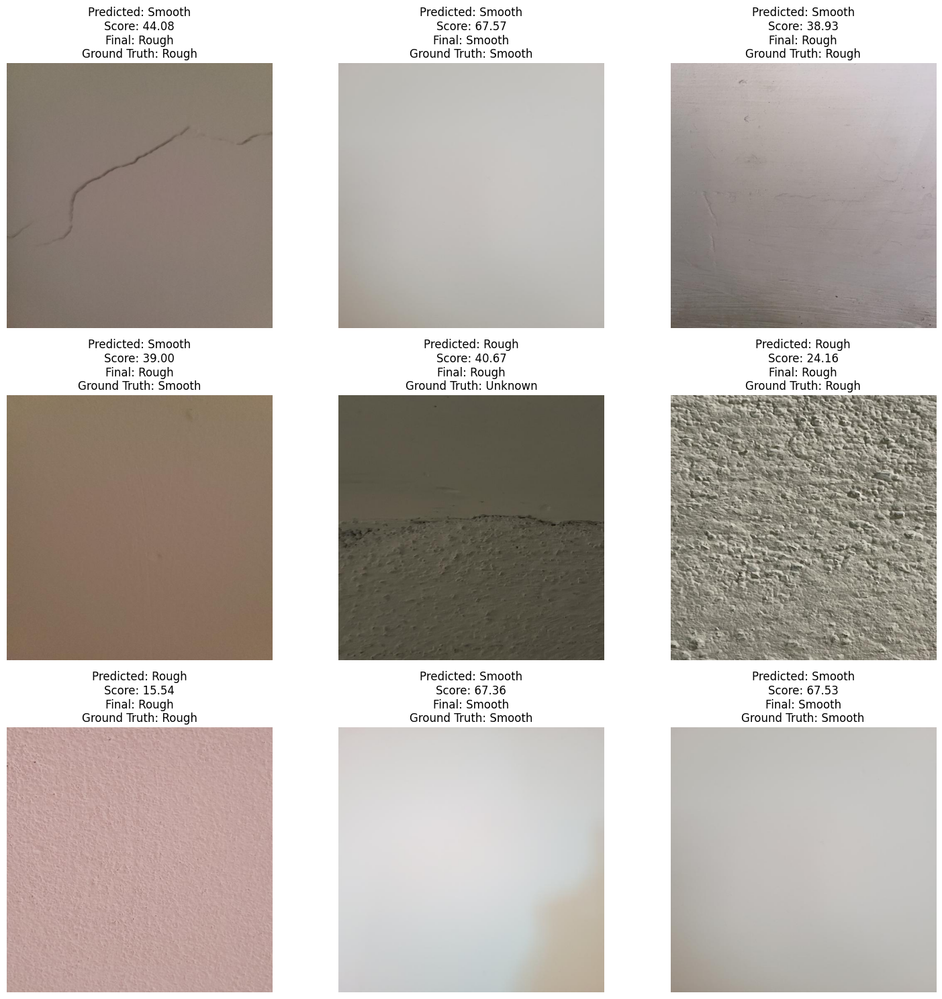

In [21]:
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
import os
import random
import json

# Function to predict label and compute smoothness score for a single image
def predict_and_score_image(model, image_path, transform):
    """
    Predicts the label and computes the smoothness score for a given image.

    Args:
        model: Trained model for inference.
        image_path (str): Path to the input image.
        transform: Transformations to preprocess the image.

    Returns:
        tuple: Predicted label (0 for Rough, 1 for Smooth) and smoothness score.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()

    # Load and preprocess the image
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Failed to load image from path: {image_path}")
    
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_resized = cv2.resize(image, (224, 224))  # Resize to a fixed size

    # Compute metrics for the image
    metrics = calculate_metrics(image_resized)

    # Combine metrics into a single smoothness score using weighted contributions
    smoothness_score = (
        0.088 * metrics['edge_density'] +  # Edge density (lower is better)
        0.708 * metrics['homogeneity'] * 100 +  # Homogeneity (higher is better)
        0.067 * metrics['gradient_magnitude'] +  # Gradient magnitude (lower is better)
        0.433 * metrics['entropy']  # Entropy (lower is better)
    )

    # Prepare image tensor for model inference
    image_tensor = transform(image_resized).unsqueeze(0).to(device)

    # Predict the label using the trained model
    with torch.no_grad():
        outputs = model(image_tensor)
        probas = torch.softmax(outputs, dim=1)
        _, predicted = torch.max(outputs, 1)

    return predicted.item(), smoothness_score, image

# Function to get ground truth label from annotations
def get_ground_truth_label(image_file, annotations):
    """
    Retrieves the ground truth label for an image from the annotations.

    Args:
        image_file (str): Name of the image file.
        annotations (dict): COCO-style annotations.

    Returns:
        str: Ground truth label ("Rough" or "Smooth").
    """
    image_id = None
    for img in annotations['images']:
        if img['file_name'] == image_file:
            image_id = img['id']
            break
    
    if image_id is None:
        return "Unknown"  # Image not found in annotations

    for ann in annotations['annotations']:
        if ann['image_id'] == image_id:
            return "Rough" if ann['category_id'] == 1 else "Smooth"  # 1: Rough, 2: Smooth
    
    return "Unknown"  # No annotation found for the image

# Define paths
test_folder = '/kaggle/input/wall-dataset/test'  # Path to the test folder
test_images = [os.path.join(test_folder, img) for img in os.listdir(test_folder) if img.endswith(('.jpg', '.png', '.jpeg'))]

# Load annotations
annotation_file = '/kaggle/input/wall-dataset/test/_annotations.coco.json'  # Path to test annotations
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

# Randomly select 9 images from the test folder
random.seed(42)  # For reproducibility
selected_images = random.sample(test_images, 9)

# Define the transform for preprocessing
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create a 3x3 grid for plotting
plt.figure(figsize=(15, 15))

# Loop through the selected images and plot predictions
for i, image_path in enumerate(selected_images):
    # Predict label and smoothness score
    predicted_label, smoothness_score, image = predict_and_score_image(trained_model, image_path, transform)
    
    # Determine the final label based on the smoothness score
    final_label = "Smooth" if smoothness_score > 60 else "Rough"
    
    # Get the ground truth label
    image_file = os.path.basename(image_path)
    ground_truth_label = get_ground_truth_label(image_file, annotations)
    
    # Plot the image and results
    plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.title(f"Predicted: {'Smooth' if predicted_label == 1 else 'Rough'}\n"
              f"Score: {smoothness_score:.2f}\n"
              f"Final: {final_label}\n"
              f"Ground Truth: {ground_truth_label}")
    plt.axis('off')  # Hide axis

plt.tight_layout()
plt.show()

# If the smoothness score exceeds 60, the wall is classified as smooth.

# Localization/detection

In [1]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 913.5/913.5 kB 20.0 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


In [2]:
from ultralytics import YOLO

# Load the YOLOv11 model
model = YOLO('/kaggle/input/yolov11m/pytorch/default/1/yolo11m.pt')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
# Fine tuning YOLOv11
model.train(
    data='/kaggle/input/fyp-robot-v3i-yolov11/data.yaml',  # Path to yaml file
    imgsz=640,                              # Image size 
    epochs=100,                              # Number of epochs
    batch=16,                               # Batch size
    name='fine_tuned_yolo'                  # Name of the training run
)

Ultralytics 8.3.67 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/input/yolov11m/pytorch/default/1/yolo11m.pt, data=/kaggle/input/fyp-robot-v3i-yolov11/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=fine_tuned_yolo, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=Fa

100%|██████████| 755k/755k [00:00<00:00, 22.3MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  1   1380352  ultralytics.nn.modules.block.C3k2            [512, 512, 1, True]           
  7                  -1  1   2360320  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 103MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/fyp-robot-v3i-yolov11/train/labels... 568 images, 9 backgrounds, 0 corrupt: 100%|██████████| 568/568 [00:01<00:00, 346.52it/s]

train: WARNING ⚠️ Cache directory /kaggle/input/fyp-robot-v3i-yolov11/train is not writeable, cache not saved.
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 69, len(boxes) = 849. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.1 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/input/fyp-robot-v3i-yolov11/valid/labels... 53 images, 2 backgrounds, 0 corrupt: 100%|██████████| 53/53 [00:00<00:00, 246.93it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/fyp-robot-v3i-yolov11/valid is not writeable, cache not saved.
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 2, len(boxes) = 56. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/fine_tuned_yolo/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/fine_tuned_yolo
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      8.86G      1.282      2.341      1.786         28        640: 100%|██████████| 36/36 [00:28<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.01it/s]

                   all         53         56      0.509     0.0132    0.00182    0.00065



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      8.64G      1.364       1.92      1.772         25        640: 100%|██████████| 36/36 [00:26<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]

                   all         53         56      0.509     0.0132    0.00182    0.00065



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      8.75G      1.273      1.765       1.73         27        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         53         56      0.101     0.0409     0.0121    0.00294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      8.68G      1.251      1.729      1.721         34        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         53         56    0.00447     0.0541    0.00191   0.000355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      8.68G      1.194       1.71      1.664         42        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         53         56      0.713      0.427      0.442      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      8.67G      1.107      1.596      1.614         20        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         53         56      0.592      0.478      0.499        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      8.68G      1.138      1.647      1.635         36        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         53         56      0.372      0.368      0.305      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      8.65G      1.151      1.659      1.654         32        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]

                   all         53         56      0.855      0.425      0.506       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      8.66G      1.143      1.599      1.656         32        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         53         56      0.349      0.513      0.353      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100       8.8G       1.06      1.466      1.571         25        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         53         56      0.286      0.234      0.199      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      8.66G      1.051      1.563      1.565         34        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         53         56      0.362      0.361      0.383      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      8.69G      1.033      1.495      1.545         24        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         53         56      0.537      0.468      0.344      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      8.82G      1.025      1.498      1.546         23        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         53         56      0.828      0.542      0.642      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      8.84G      1.024      1.443      1.534         25        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         53         56      0.885       0.61      0.705      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      8.71G     0.9805      1.393      1.518         20        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         53         56      0.844      0.527      0.651      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100       8.8G     0.9903      1.456      1.528         26        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         53         56      0.721      0.478      0.596      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      8.67G     0.9395       1.35      1.482         27        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         53         56       0.87      0.557       0.66      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      8.68G     0.9719      1.438      1.506         24        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         53         56      0.608      0.651      0.628      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100       8.7G     0.9518      1.384      1.481         22        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         53         56      0.432      0.678      0.499      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      8.99G     0.9404       1.35      1.499         31        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         53         56      0.848      0.558       0.65      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      8.98G      0.914      1.346      1.473         26        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]

                   all         53         56      0.882      0.592      0.711      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      8.66G     0.9589      1.403      1.516         24        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.47it/s]

                   all         53         56      0.766      0.598      0.668      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      8.82G     0.9573      1.361      1.483         28        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         53         56      0.648      0.557      0.605      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      8.81G      0.989      1.432      1.532         21        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.47it/s]

                   all         53         56      0.796      0.596       0.65      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      8.65G     0.9146      1.331      1.465         28        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         53         56      0.879      0.557      0.698      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      8.65G     0.9161      1.336      1.461         22        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         53         56      0.827      0.583      0.669      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100       8.7G     0.9231      1.298      1.456         23        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         53         56      0.914      0.581      0.742      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      8.65G     0.8652      1.253      1.424         27        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         53         56      0.919      0.516      0.705      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      8.82G     0.8868      1.273      1.455         36        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         53         56      0.873      0.599      0.739       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      8.66G     0.9234      1.285      1.455         28        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]

                   all         53         56      0.732      0.599      0.679      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      8.66G     0.9376      1.324       1.47         23        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         53         56       0.92      0.583      0.731      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      8.68G     0.8842       1.23      1.441         22        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         53         56      0.513      0.651      0.562      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      8.81G     0.8951      1.241      1.429         24        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]

                   all         53         56      0.844       0.64      0.755      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      8.68G     0.8389       1.19      1.387         25        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         53         56      0.729      0.677      0.712       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100       8.7G     0.9055      1.273      1.445         31        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         53         56       0.88      0.614      0.738      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      8.67G     0.8484      1.242      1.401         30        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         53         56      0.721      0.636      0.741      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      8.65G     0.8812      1.262      1.437         29        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         53         56       0.85      0.672      0.752      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      8.69G     0.8928      1.274      1.436         46        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         53         56      0.873      0.634      0.788      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      8.81G     0.8406      1.242      1.392         29        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         53         56       0.78      0.618      0.707      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      8.68G     0.9177      1.304      1.461         22        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         53         56      0.882      0.624      0.758      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      8.65G     0.8295      1.194      1.412         24        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         53         56      0.534      0.544      0.619      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      8.69G     0.8557      1.237      1.415         17        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         53         56      0.933      0.598      0.768      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      8.65G     0.8493      1.223      1.427         31        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         53         56       0.96      0.545      0.721      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      8.66G     0.8742       1.25      1.422         35        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         53         56      0.798      0.659      0.767      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      8.67G     0.8029      1.142       1.38         43        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         53         56      0.899      0.626      0.747      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       8.8G     0.9083      1.297      1.436         35        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         53         56      0.794       0.69       0.76       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      8.65G      0.837      1.191      1.394         23        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         53         56      0.805      0.647      0.734      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      8.82G     0.8268      1.205      1.385         43        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.47it/s]

                   all         53         56       0.73      0.715      0.753      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100       8.8G     0.8411      1.179      1.394         55        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         53         56      0.912      0.615      0.784      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      8.71G      0.862      1.242      1.411         43        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         53         56      0.825      0.632      0.752      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      8.68G     0.7741      1.141      1.356         25        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         53         56      0.916      0.585      0.733      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      8.71G     0.8303      1.208      1.386         27        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         53         56      0.777      0.732       0.76      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      8.81G     0.8136       1.19      1.379         31        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         53         56       0.81      0.662      0.778      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      8.81G      0.832      1.229      1.396         40        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         53         56      0.807      0.604      0.739      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      8.79G     0.7991      1.129      1.364         33        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         53         56      0.895      0.662      0.793       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      8.68G     0.7706      1.131      1.354         24        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         53         56       0.92       0.63      0.783      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100       8.8G     0.8451      1.215       1.41         30        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         53         56       0.84      0.633      0.711      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      8.67G     0.7926      1.153      1.361         21        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         53         56      0.938      0.602      0.758      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      8.66G     0.8463      1.201      1.399         35        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.47it/s]

                   all         53         56      0.769       0.67      0.735      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      8.68G     0.7822      1.105      1.355         37        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         53         56      0.847      0.705      0.791      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      8.66G     0.8242      1.159       1.38         20        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         53         56      0.802      0.652      0.749      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      8.66G     0.7827      1.141      1.357         33        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.47it/s]

                   all         53         56      0.813      0.706      0.784      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      8.82G     0.7947      1.131      1.363         32        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         53         56      0.787      0.706      0.783      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      8.68G     0.8198      1.145       1.38         19        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         53         56      0.842      0.691      0.794      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      8.68G     0.7773      1.121      1.357         29        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]

                   all         53         56      0.889      0.653      0.766      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      8.68G     0.8534      1.177      1.389         43        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         53         56      0.798       0.72      0.782      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      8.81G     0.7826      1.145      1.358         39        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         53         56      0.794      0.699      0.759      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100       8.7G     0.7844      1.128      1.355         27        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         53         56      0.846      0.719      0.804      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      8.67G      0.842      1.158      1.363         28        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         53         56      0.795      0.682      0.777      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      8.65G     0.7468      1.098      1.327         26        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         53         56      0.834       0.69      0.795      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      8.75G      0.729      1.079      1.331         22        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.47it/s]

                   all         53         56      0.857      0.641      0.775      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      8.65G     0.7986       1.15      1.352         23        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         53         56      0.903      0.692      0.795      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      8.68G     0.7967      1.146      1.368         17        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         53         56      0.867      0.677       0.79      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      8.68G     0.7249      1.075      1.311         22        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.47it/s]

                   all         53         56       0.87      0.656       0.77      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      8.71G     0.7705      1.096      1.332         28        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         53         56      0.619      0.683      0.664      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      8.67G     0.7095      1.039      1.304         24        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         53         56      0.801      0.709      0.804      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      8.68G     0.8206      1.131      1.377         30        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         53         56      0.845      0.699      0.789      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      8.68G     0.7372      1.095      1.316         29        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         53         56      0.873      0.678      0.783      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      8.81G     0.7466      1.105      1.331         24        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         53         56      0.902      0.636      0.787      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      8.66G      0.751      1.059      1.323         17        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         53         56      0.855      0.726      0.806      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100       8.7G     0.7777      1.098      1.346         32        640: 100%|██████████| 36/36 [00:26<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         53         56      0.877      0.708      0.807      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      8.79G      0.709      1.012      1.307         26        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         53         56      0.854      0.689      0.765      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      8.81G     0.7347      1.061      1.314         40        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         53         56      0.798      0.719      0.795      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      8.82G     0.7044      1.061        1.3         32        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         53         56       0.82        0.7      0.798      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      8.71G     0.7587      1.051      1.333         40        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         53         56      0.829      0.699      0.806      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      8.95G     0.7516      1.053      1.325         27        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         53         56      0.837      0.732       0.81      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100       8.8G     0.7352      1.034      1.319         31        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         53         56      0.727      0.755      0.797      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      8.67G     0.7293      1.032      1.312         21        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         53         56      0.815      0.718      0.803      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      8.68G     0.6928      1.014      1.286         21        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         53         56      0.875      0.692      0.825      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      8.82G     0.7375      1.021        1.3         22        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         53         56      0.853       0.66      0.771      0.674


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      8.66G     0.8842      1.307      1.537          9        640: 100%|██████████| 36/36 [00:27<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         53         56       0.86       0.68      0.778      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100       8.8G      0.819      1.079      1.477          8        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         53         56      0.898      0.669      0.806      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100         9G      0.855      1.094      1.497         27        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         53         56      0.823      0.733      0.815      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      8.82G     0.7855      1.028      1.457         12        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         53         56      0.827      0.692      0.812      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      8.79G     0.7836      1.026      1.448          8        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         53         56      0.876      0.659      0.798      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      8.82G     0.7963      1.047      1.462         10        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         53         56      0.855       0.71      0.829      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      8.66G      0.805      1.045      1.459          9        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         53         56      0.789      0.811      0.844      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      8.79G     0.7784      1.013      1.453          8        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         53         56        0.8      0.823      0.847       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      8.68G     0.7977      1.044      1.467         10        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         53         56       0.89      0.664      0.816      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      8.67G     0.7565     0.9914      1.425          8        640: 100%|██████████| 36/36 [00:26<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         53         56      0.726      0.827      0.821      0.701



100 epochs completed in 0.807 hours.
Optimizer stripped from runs/detect/fine_tuned_yolo/weights/last.pt, 40.5MB
Optimizer stripped from runs/detect/fine_tuned_yolo/weights/best.pt, 40.5MB

Validating runs/detect/fine_tuned_yolo/weights/best.pt...
Ultralytics 8.3.67 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11m summary (fused): 303 layers, 20,031,574 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.03it/s]


                   all         53         56        0.8      0.823      0.847       0.71
            Rough Wall         38         38      0.763      0.789      0.785      0.589
           Smooth Wall         18         18      0.837      0.856      0.909       0.83


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 13.2ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/fine_tuned_yolo


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e06e8fbbca0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [5]:
# Load the fine-tuned model
model = YOLO('runs/detect/fine_tuned_yolo/weights/best.pt')

# Save the model to a specific location
model.save("fine_tuned_model.pt")


image 1/1 /kaggle/input/fyp-robot-v3i-yolov11/test/images/20240122_101903_jpg.rf.99aad4258d124925de88669fcceadeca.jpg: 640x640 1 Rough Wall, 17.7ms
Speed: 1.6ms preprocess, 17.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


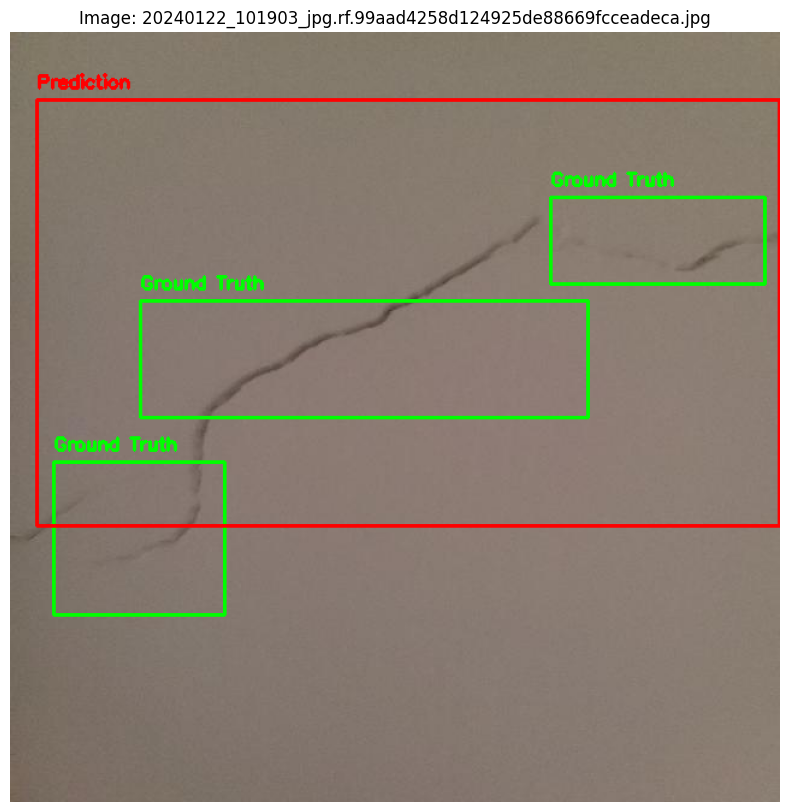


image 1/1 /kaggle/input/fyp-robot-v3i-yolov11/test/images/20240122_102135_009_saved_jpg.rf.5e13942a261b93734668ac023f5eafa1.jpg: 640x640 1 Smooth Wall, 17.7ms
Speed: 1.7ms preprocess, 17.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


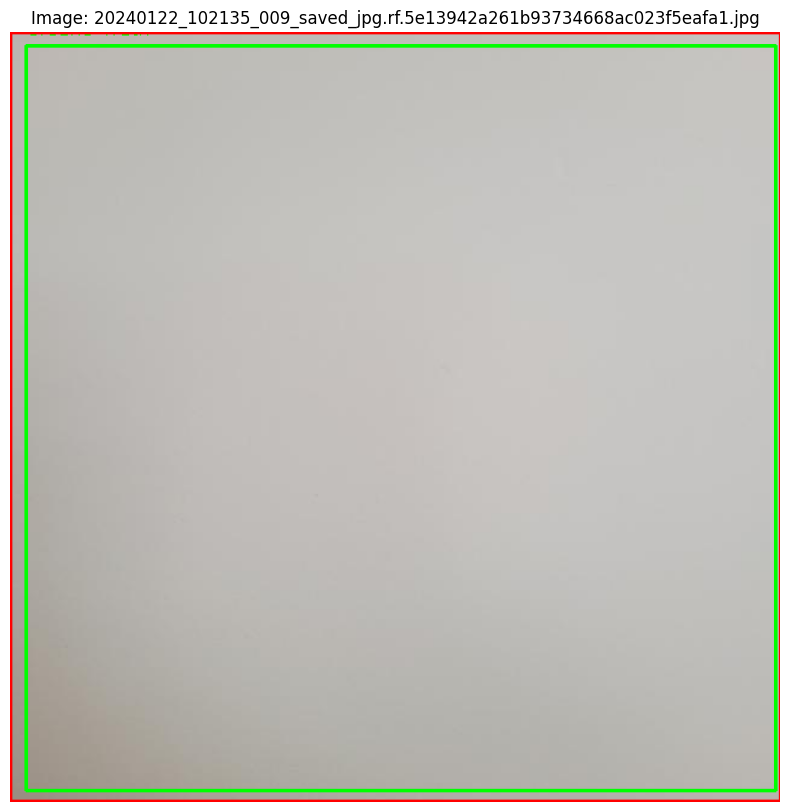


image 1/1 /kaggle/input/fyp-robot-v3i-yolov11/test/images/IMG_7084_JPG.rf.6ba10ff04765fcb7813d17737ac46f5b.jpg: 640x640 1 Rough Wall, 17.7ms
Speed: 1.6ms preprocess, 17.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


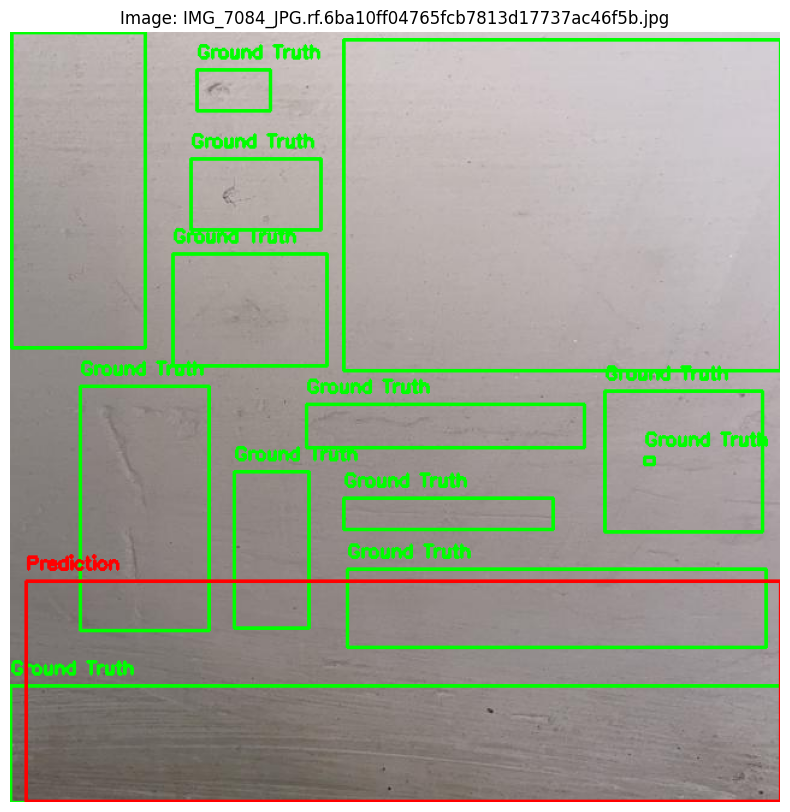


image 1/1 /kaggle/input/fyp-robot-v3i-yolov11/test/images/20240122_101914_jpg.rf.0b980054143a41916fa836a96654922d.jpg: 640x640 1 Smooth Wall, 17.8ms
Speed: 1.8ms preprocess, 17.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


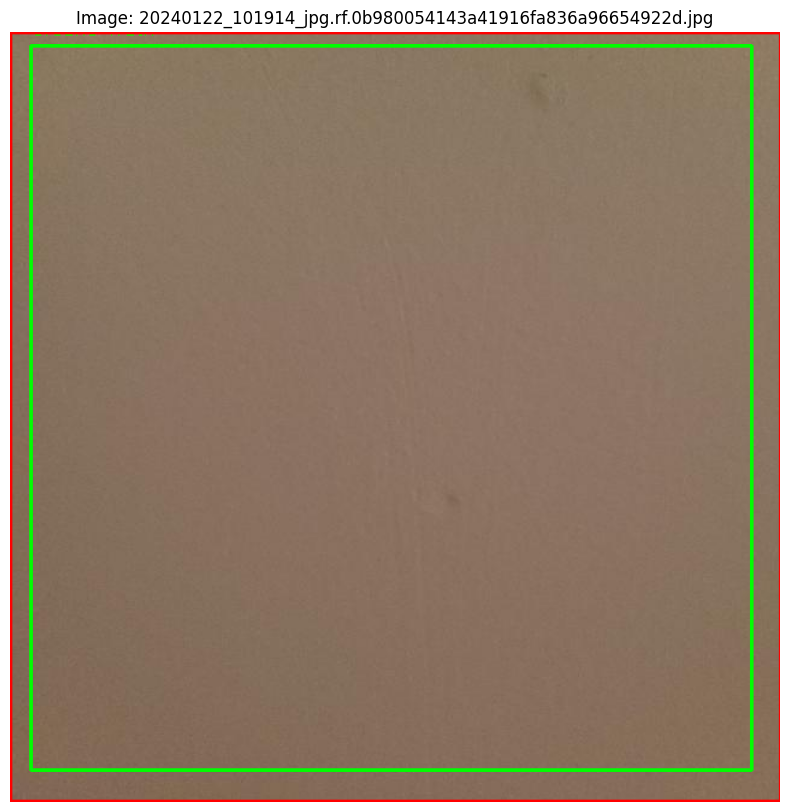


image 1/1 /kaggle/input/fyp-robot-v3i-yolov11/test/images/IMG_7090_JPG.rf.da4cb3da033cd9070dffdac4938bb646.jpg: 640x640 1 Rough Wall, 1 Smooth Wall, 17.7ms
Speed: 1.6ms preprocess, 17.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


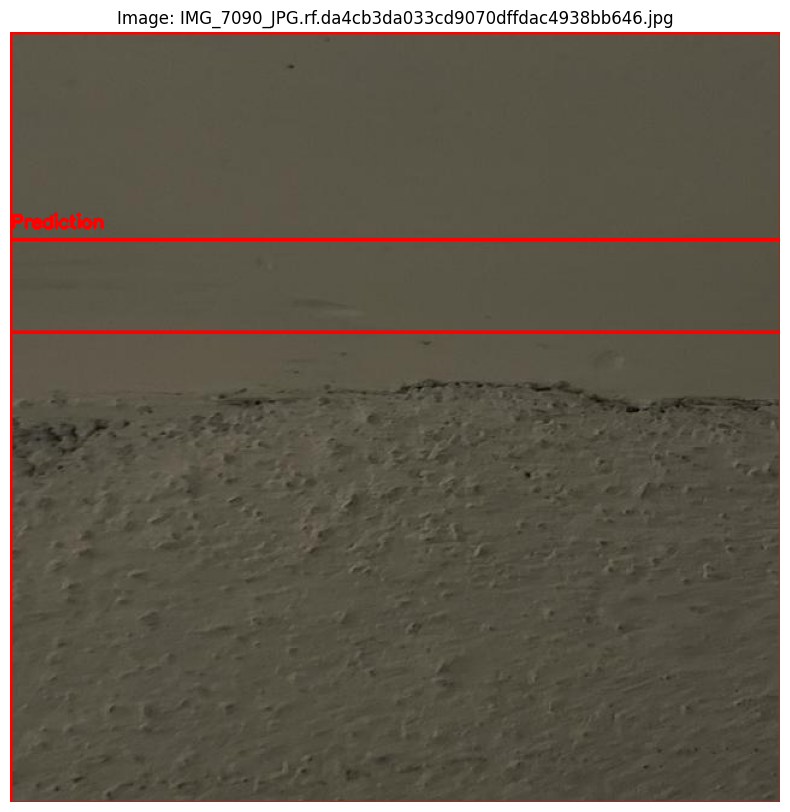

In [17]:
import cv2
import matplotlib.pyplot as plt
import os
import random
from ultralytics import YOLO

# Load the fine-tuned YOLO model
model = YOLO("runs/detect/fine_tuned_yolo/weights/best.pt")  # Path to the fine-tuned YOLO model

# Paths to test images and labels
test_images_path = "/kaggle/input/fyp-robot-v3i-yolov11/test/images"  # Path to test images
test_labels_path = "/kaggle/input/fyp-robot-v3i-yolov11/test/labels"  # Path to test labels

# Helper function to draw bounding boxes on an image
def draw_boxes(image, boxes, labels, color, thickness=2):
    """
    Draws bounding boxes and labels on an image.

    Args:
        image: Input image.
        boxes: List of bounding boxes in [x_center, y_center, width, height] format.
        labels: List of labels for each bounding box.
        color: Color of the bounding boxes and labels (BGR format).
        thickness: Thickness of the bounding box lines.

    Returns:
        Image with bounding boxes and labels drawn.
    """
    for box, label in zip(boxes, labels):
        x_center, y_center, width, height = box
        x_min = x_center - width / 2  # Convert center coordinates to top-left corner
        y_min = y_center - height / 2
        x_max = x_center + width / 2  # Convert center coordinates to bottom-right corner
        y_max = y_center + height / 2
        # Draw the bounding box
        cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), color, thickness)
        # Add the label text
        cv2.putText(image, label, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, thickness)
    return image

# Get a list of all test images
test_images = [img for img in os.listdir(test_images_path) if img.endswith(".jpg")]

# Randomly select 5 images from the test folder
random.seed(42)  # Set seed for reproducibility
selected_images = random.sample(test_images, 5)

# Iterate over the selected images
for image_file in selected_images:
    # Load the test image
    image_path = os.path.join(test_images_path, image_file)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for display
    h, w, _ = image.shape  # Get image dimensions

    # Load ground truth bounding boxes from the label file
    label_file = os.path.join(test_labels_path, image_file.replace(".jpg", ".txt"))
    gt_boxes = []  # List to store ground truth boxes
    if os.path.exists(label_file):
        with open(label_file, "r") as f:
            for line in f:
                class_id, x_center, y_center, width, height = map(float, line.strip().split())
                # Convert normalized YOLO format to absolute pixel values
                gt_boxes.append([x_center * w, y_center * h, width * w, height * h])
    gt_labels = ["Ground Truth" for _ in gt_boxes]  # Labels for ground truth boxes

    # Get predictions from the YOLO model
    results = model(image_path)
    predictions = results[0].boxes.xyxy.cpu().numpy()  # Predicted bounding boxes in [x_min, y_min, x_max, y_max] format

    # Convert predicted boxes from [x_min, y_min, x_max, y_max] to [x_center, y_center, width, height]
    pred_boxes = []
    for box in predictions:
        x_min, y_min, x_max, y_max = box
        width = x_max - x_min  # Calculate width
        height = y_max - y_min  # Calculate height
        x_center = x_min + width / 2  # Calculate x_center
        y_center = y_min + height / 2  # Calculate y_center
        pred_boxes.append([x_center, y_center, width, height])  # Append in [x_center, y_center, width, height] format

    pred_labels = ["Prediction" for _ in pred_boxes]  # Labels for predicted boxes

    # Draw ground truth boxes (green) and predicted boxes (red) on the image
    image_with_boxes = draw_boxes(image.copy(), gt_boxes, gt_labels, color=(0, 255, 0))  # Green for ground truth
    image_with_boxes = draw_boxes(image_with_boxes, pred_boxes, pred_labels, color=(255, 0, 0))  # Red for predictions

    # Display the result
    plt.figure(figsize=(10, 10))
    plt.imshow(image_with_boxes)
    plt.axis("off")
    plt.title(f"Image: {image_file}")
    plt.show()

Randomly selecting a subset of images, predicting bounding boxes using the model, and comparing the predictions with the ground truth annotations.

Epoch 1: Train Loss 0.0138, Train Acc 79.33%, Val Loss 0.0071, Val Acc 92.86%
Epoch 2: Train Loss 0.0088, Train Acc 88.22%, Val Loss 0.0045, Val Acc 96.43%
Epoch 3: Train Loss 0.0069, Train Acc 92.07%, Val Loss 0.0068, Val Acc 96.43%
Epoch 4: Train Loss 0.0068, Train Acc 90.99%, Val Loss 0.0047, Val Acc 96.43%
Epoch 5: Train Loss 0.0061, Train Acc 93.03%, Val Loss 0.0055, Val Acc 96.43%
Epoch 6: Train Loss 0.0052, Train Acc 93.39%, Val Loss 0.0048, Val Acc 94.64%
Epoch 7: Train Loss 0.0048, Train Acc 93.87%, Val Loss 0.0069, Val Acc 96.43%
Epoch 8: Train Loss 0.0040, Train Acc 95.19%, Val Loss 0.0069, Val Acc 92.86%
Epoch 9: Train Loss 0.0050, Train Acc 94.23%, Val Loss 0.0039, Val Acc 96.43%
Epoch 10: Train Loss 0.0060, Train Acc 93.51%, Val Loss 0.0032, Val Acc 96.43%
Epoch 11: Train Loss 0.0038, Train Acc 95.67%, Val Loss 0.0036, Val Acc 96.43%
Epoch 12: Train Loss 0.0037, Train Acc 95.91%, Val Loss 0.0049, Val Acc 94.64%
Epoch 13: Train Loss 0.0040, Train Acc 95.67%, Val Loss 0.008

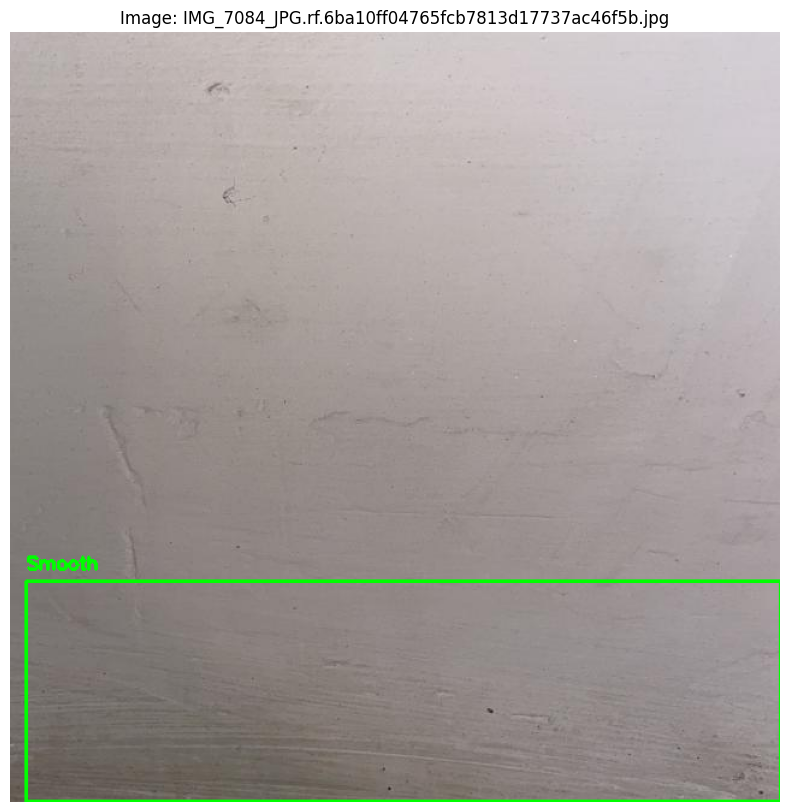


image 1/1 /kaggle/input/wall-dataset/test/20240122_103252_jpg.rf.5cc0da8597418efb55e633508e3c0039.jpg: 640x640 1 Rough Wall, 17.7ms
Speed: 1.7ms preprocess, 17.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


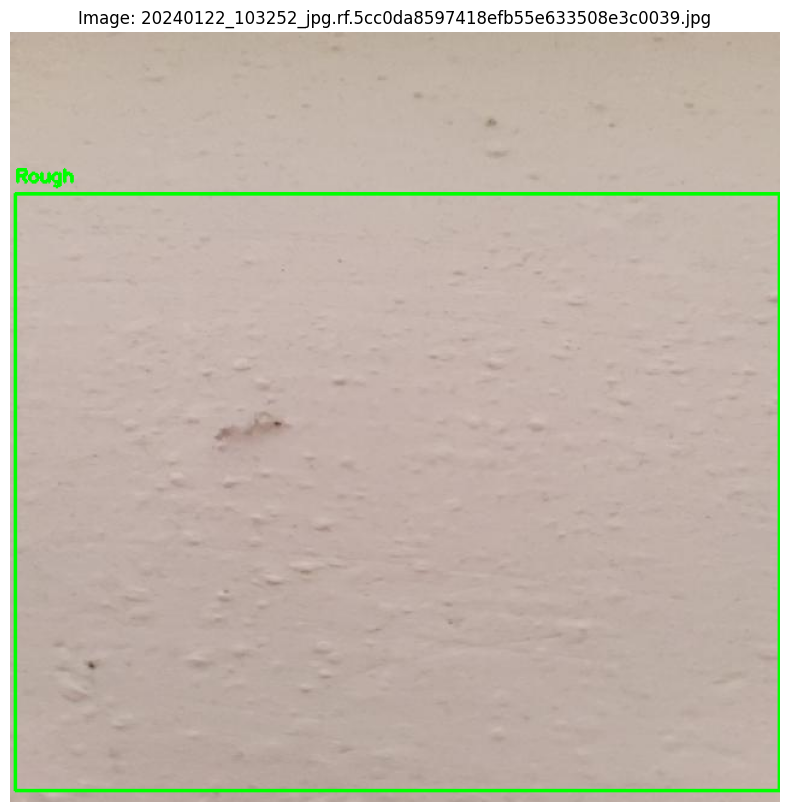


image 1/1 /kaggle/input/wall-dataset/test/20240122_103650_009_saved_jpg.rf.98d591ab660e8dc48bb9f22416700f67.jpg: 640x640 1 Rough Wall, 17.8ms
Speed: 1.6ms preprocess, 17.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


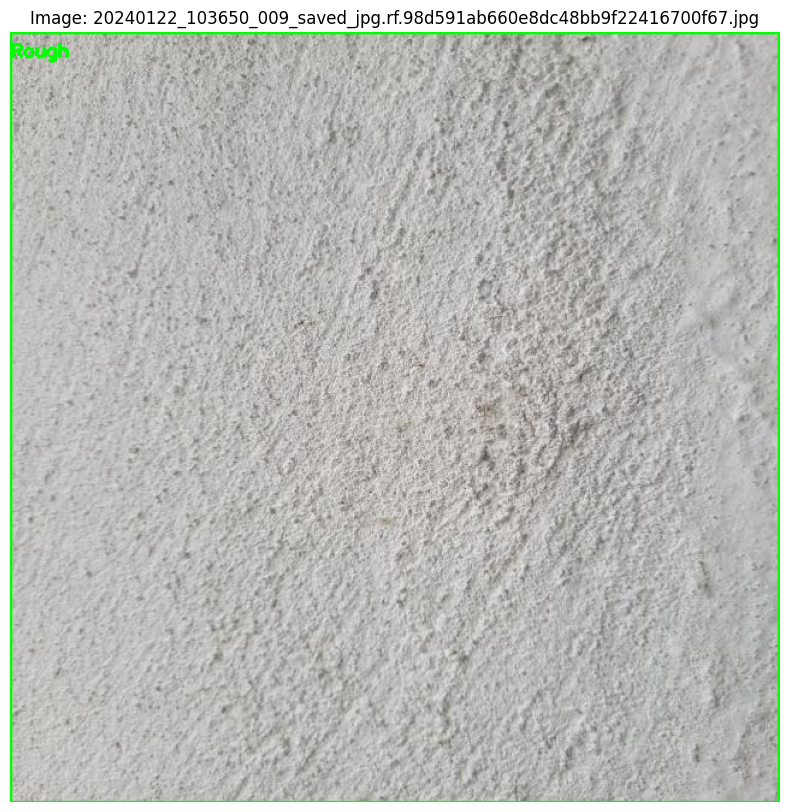


image 1/1 /kaggle/input/wall-dataset/test/20240122_102135_009_saved_jpg.rf.5e13942a261b93734668ac023f5eafa1.jpg: 640x640 1 Smooth Wall, 17.8ms
Speed: 1.7ms preprocess, 17.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


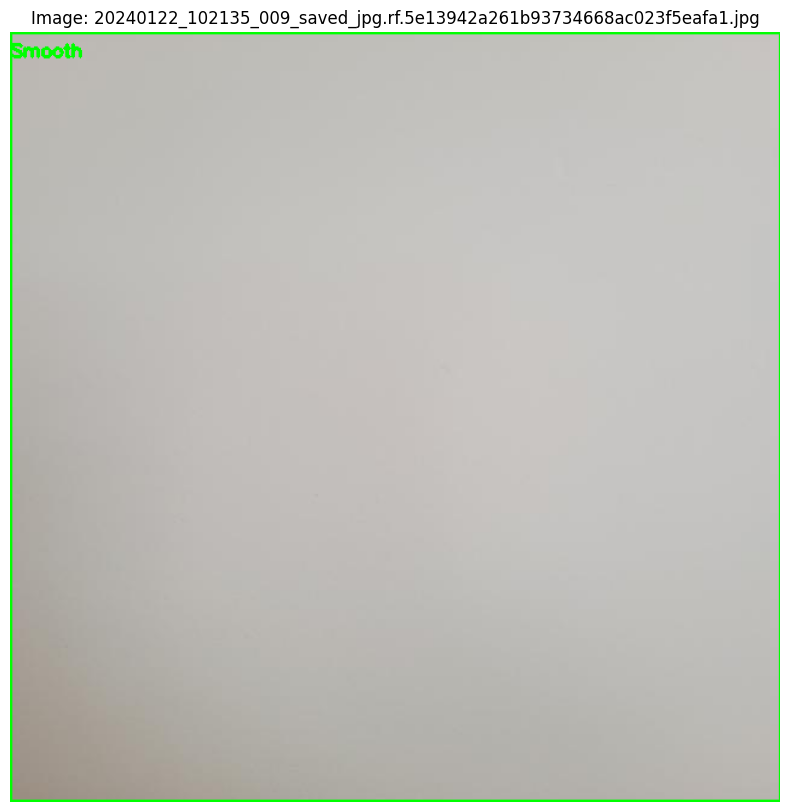


image 1/1 /kaggle/input/wall-dataset/test/20240122_102445_007_saved-1-_jpg.rf.8c31cc04421472155e6827f2cc1bdcf0.jpg: 640x640 1 Smooth Wall, 17.8ms
Speed: 1.7ms preprocess, 17.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


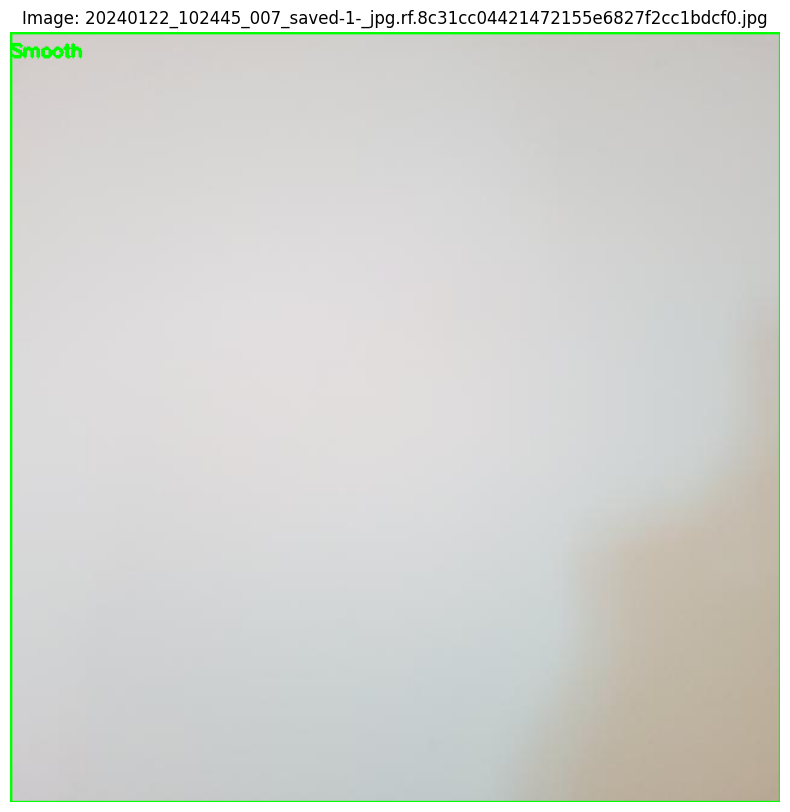


image 1/1 /kaggle/input/wall-dataset/test/20240122_102509-0-_jpg.rf.e8530692029dcd9be0a7886799e7b11f.jpg: 640x640 1 Rough Wall, 17.7ms
Speed: 1.7ms preprocess, 17.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


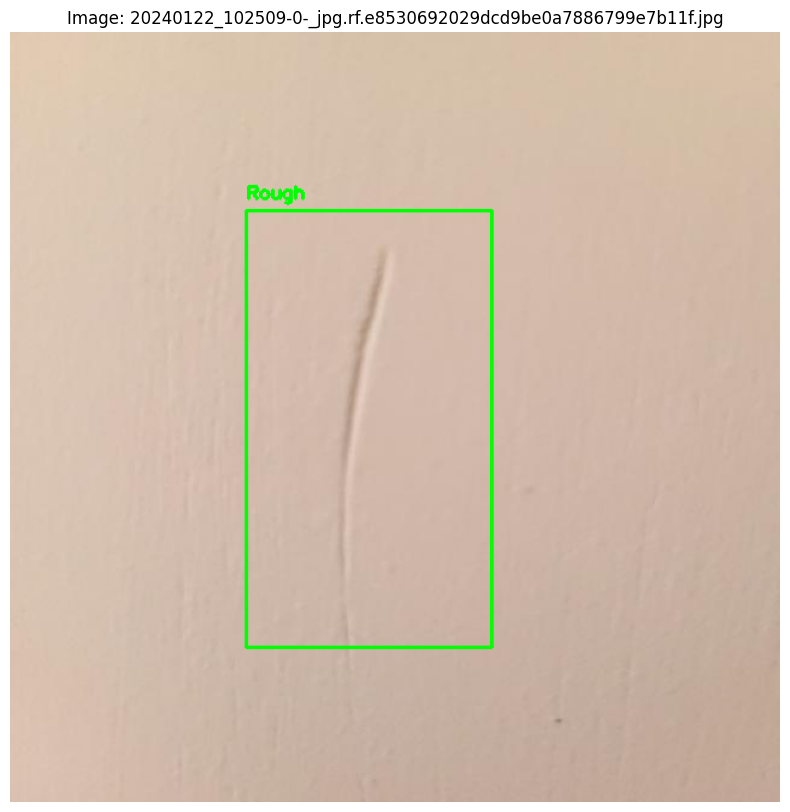


image 1/1 /kaggle/input/wall-dataset/test/20240122_103051_jpg.rf.f023f8041f19400d69d790849d413db3.jpg: 640x640 (no detections), 17.7ms
Speed: 1.8ms preprocess, 17.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


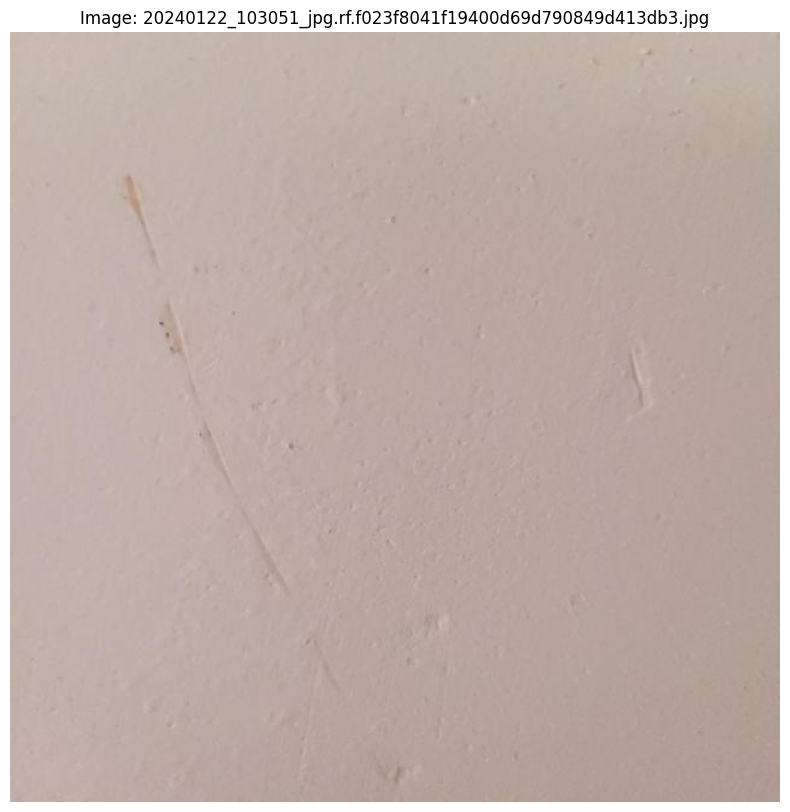


image 1/1 /kaggle/input/wall-dataset/test/IMG_7127_JPG.rf.1aa6142dcd9b837e7263d021a96af83e.jpg: 640x640 1 Rough Wall, 17.8ms
Speed: 1.8ms preprocess, 17.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


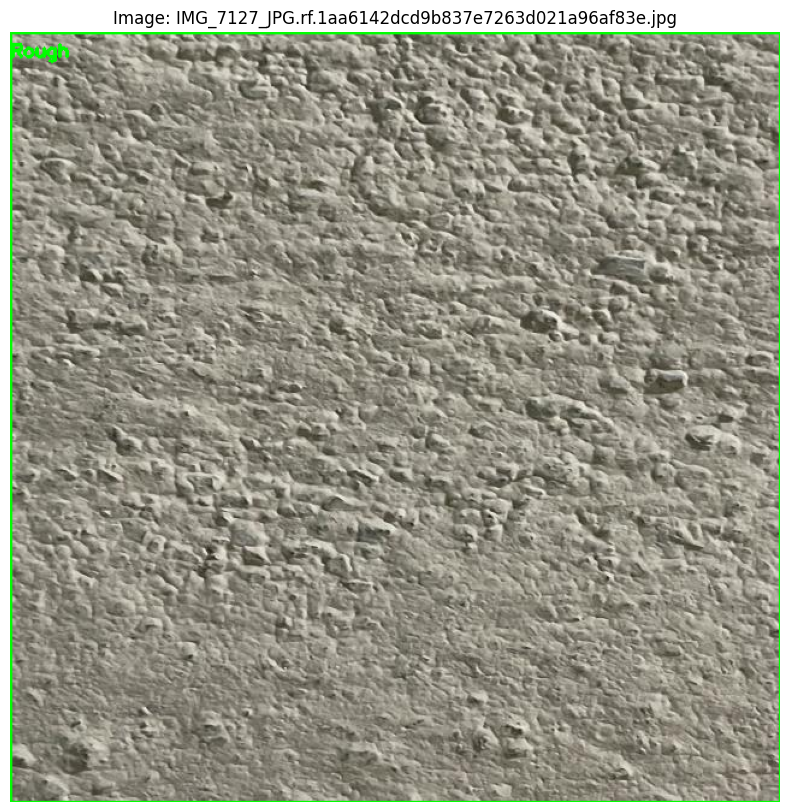


image 1/1 /kaggle/input/wall-dataset/test/IMG_7090_JPG.rf.da4cb3da033cd9070dffdac4938bb646.jpg: 640x640 1 Rough Wall, 1 Smooth Wall, 17.8ms
Speed: 2.0ms preprocess, 17.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


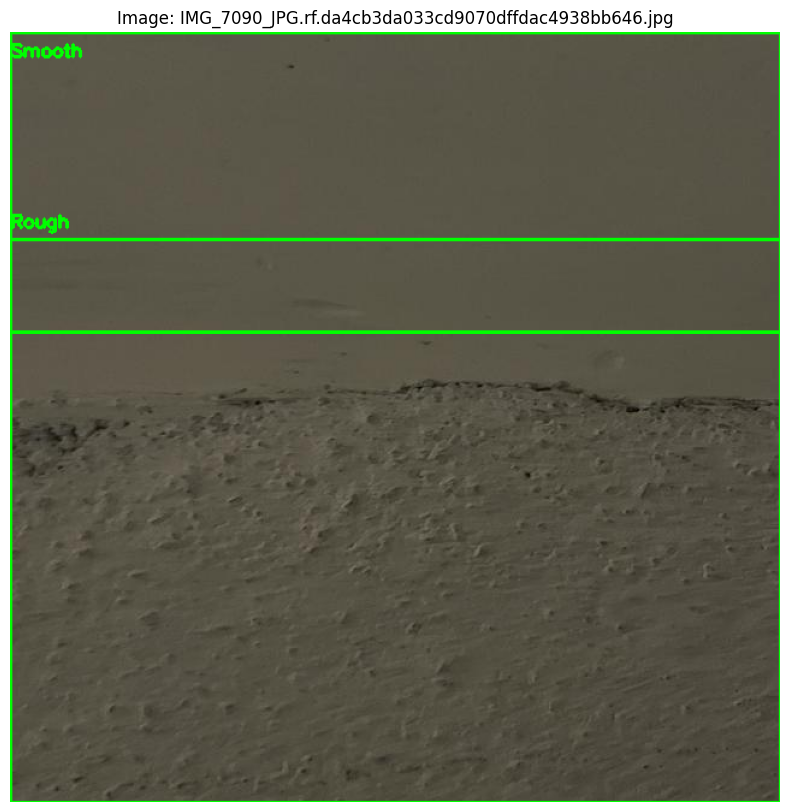


image 1/1 /kaggle/input/wall-dataset/test/20240122_102640_jpg.rf.364ada9536641e0975be465917bf1bf9.jpg: 640x640 (no detections), 18.0ms
Speed: 2.3ms preprocess, 18.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


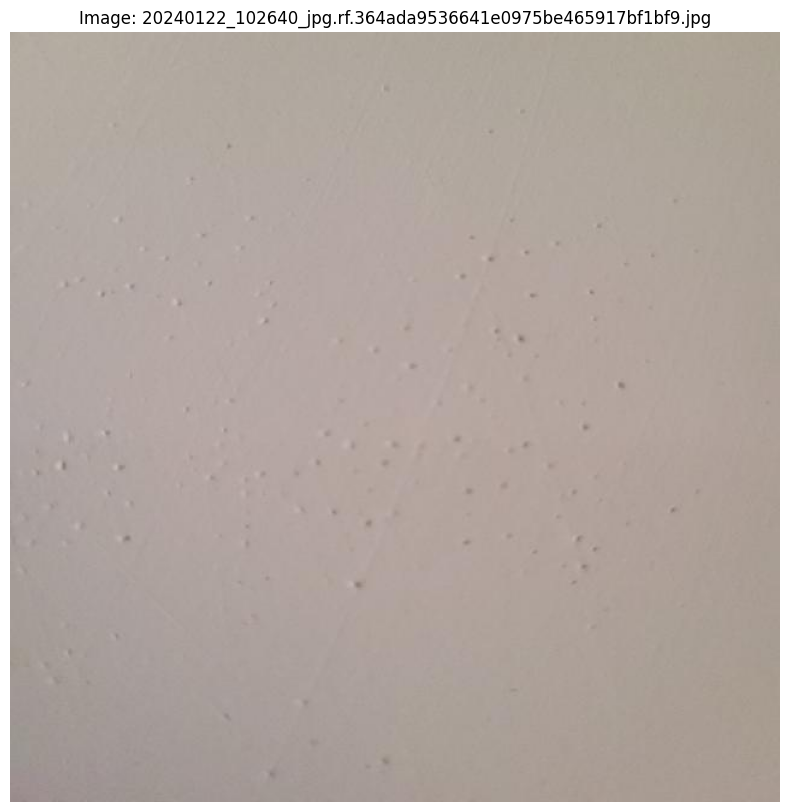


image 1/1 /kaggle/input/wall-dataset/test/20240122_102044_jpg.rf.a8e92218909ffec2457863c10631beb7.jpg: 640x640 1 Smooth Wall, 17.8ms
Speed: 1.8ms preprocess, 17.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


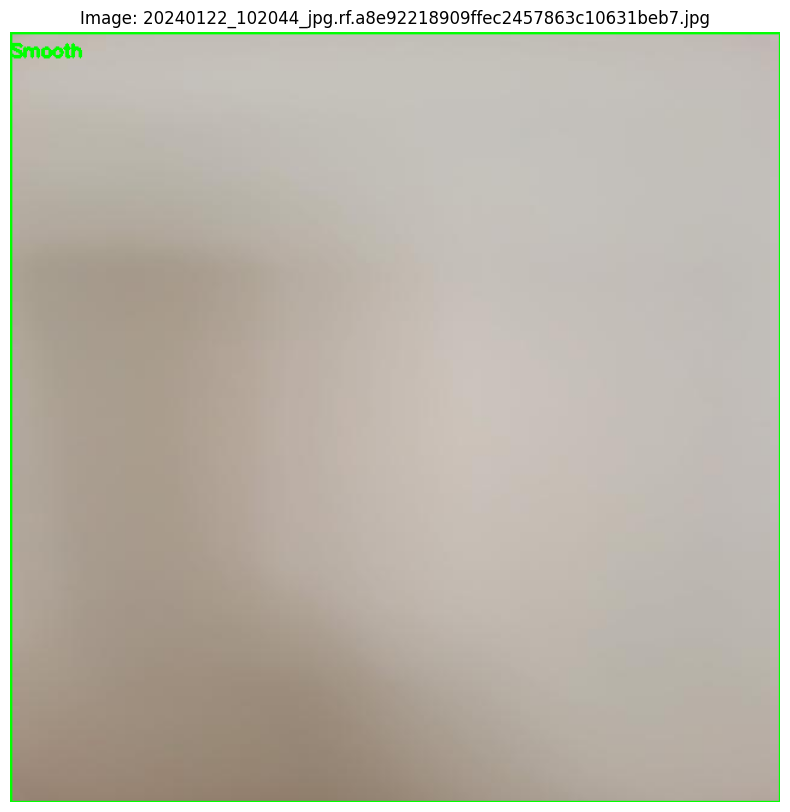


image 1/1 /kaggle/input/wall-dataset/test/20240122_101945_jpg.rf.270ceda6f42067feebe10de7e8755a09.jpg: 640x640 1 Smooth Wall, 17.8ms
Speed: 1.7ms preprocess, 17.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


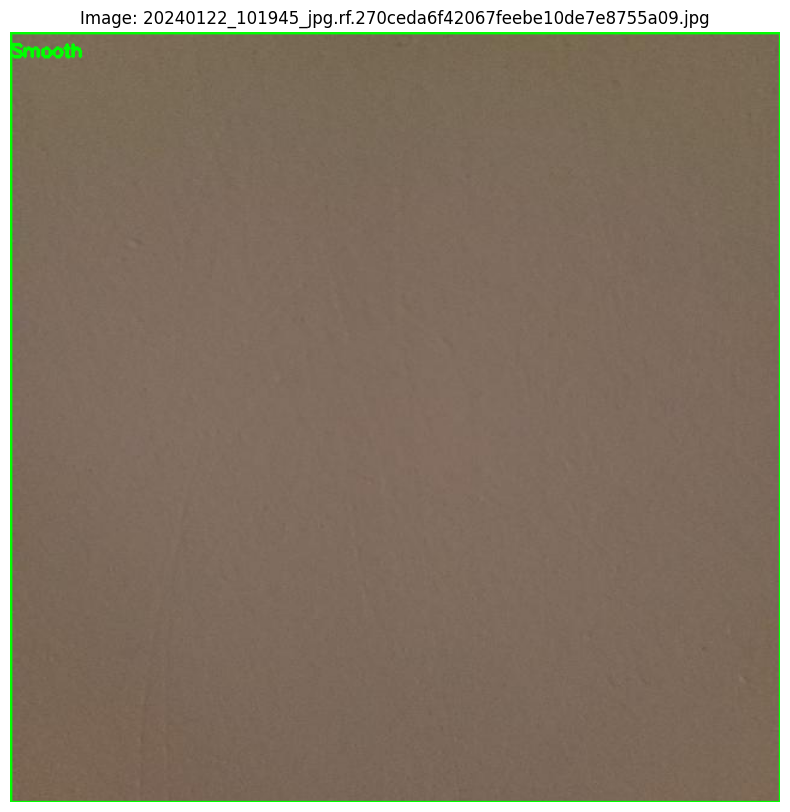


image 1/1 /kaggle/input/wall-dataset/test/20240122_102259_jpg.rf.db75b63e77f7502f6a608fa82a5e2907.jpg: 640x640 (no detections), 17.8ms
Speed: 1.7ms preprocess, 17.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


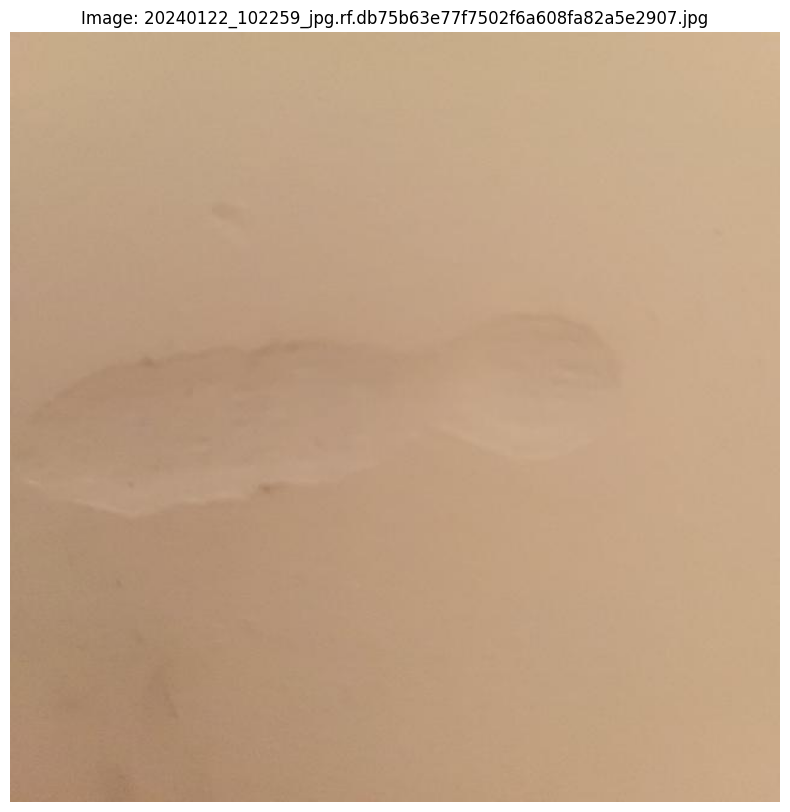


image 1/1 /kaggle/input/wall-dataset/test/20240122_102445_006_saved-1-_jpg.rf.a046cdf079682ba1de59cf9768e33a9e.jpg: 640x640 1 Smooth Wall, 17.8ms
Speed: 1.7ms preprocess, 17.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


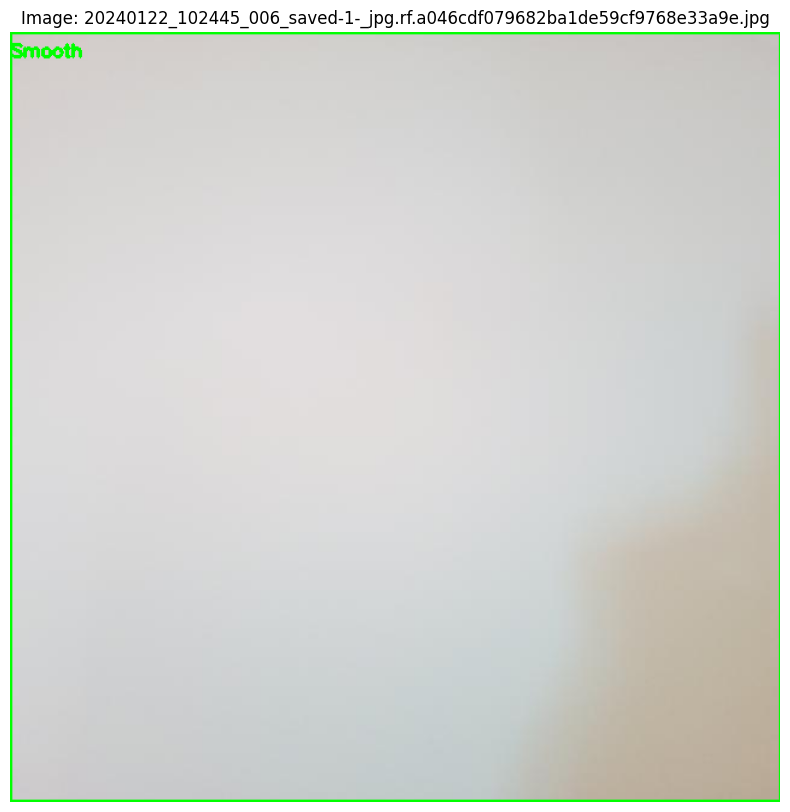


image 1/1 /kaggle/input/wall-dataset/test/20240122_102810_002_saved-1-_jpg.rf.760ff9ba066fa7e772a7c1e4ad962ffb.jpg: 640x640 1 Rough Wall, 17.8ms
Speed: 1.7ms preprocess, 17.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


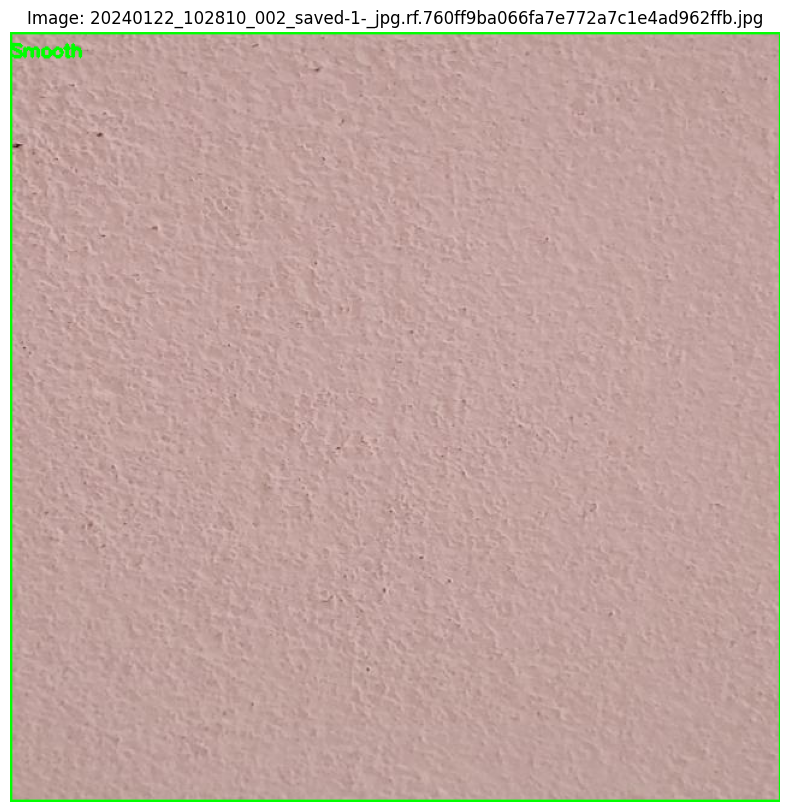


image 1/1 /kaggle/input/wall-dataset/test/20240122_102027_jpg.rf.59f76500a3a46330ed116c9188b1d5a0.jpg: 640x640 1 Smooth Wall, 17.9ms
Speed: 2.3ms preprocess, 17.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


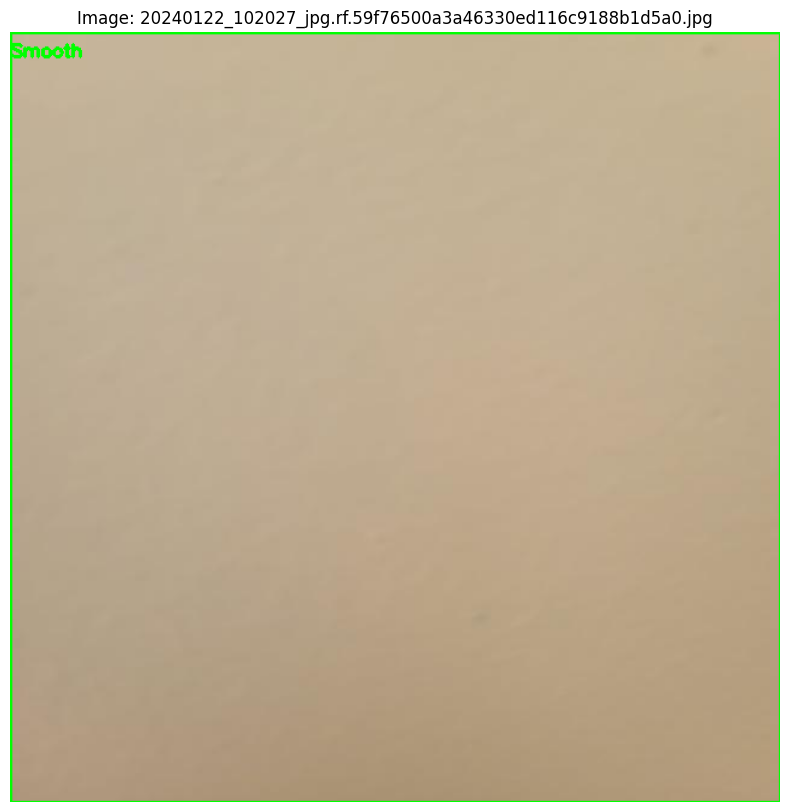


image 1/1 /kaggle/input/wall-dataset/test/20240122_103650_005_saved_jpg.rf.cff0429be0219a7d3d872b34551e5c32.jpg: 640x640 1 Rough Wall, 17.8ms
Speed: 1.7ms preprocess, 17.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


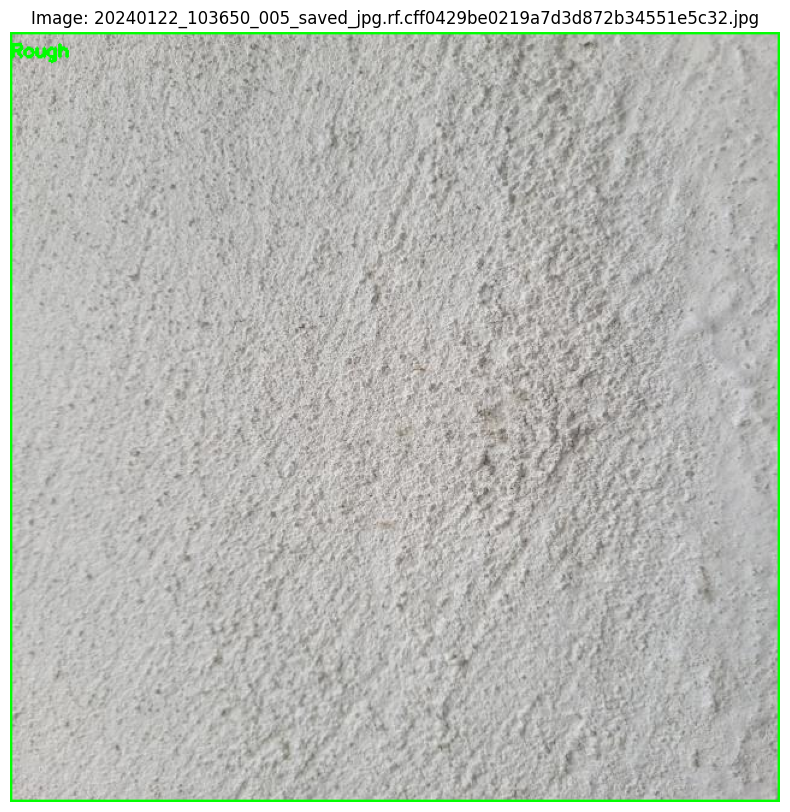


image 1/1 /kaggle/input/wall-dataset/test/IMG_7140_JPG.rf.f4b2702284e61be51691fed97ffa6ef7.jpg: 640x640 1 Rough Wall, 17.7ms
Speed: 1.7ms preprocess, 17.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


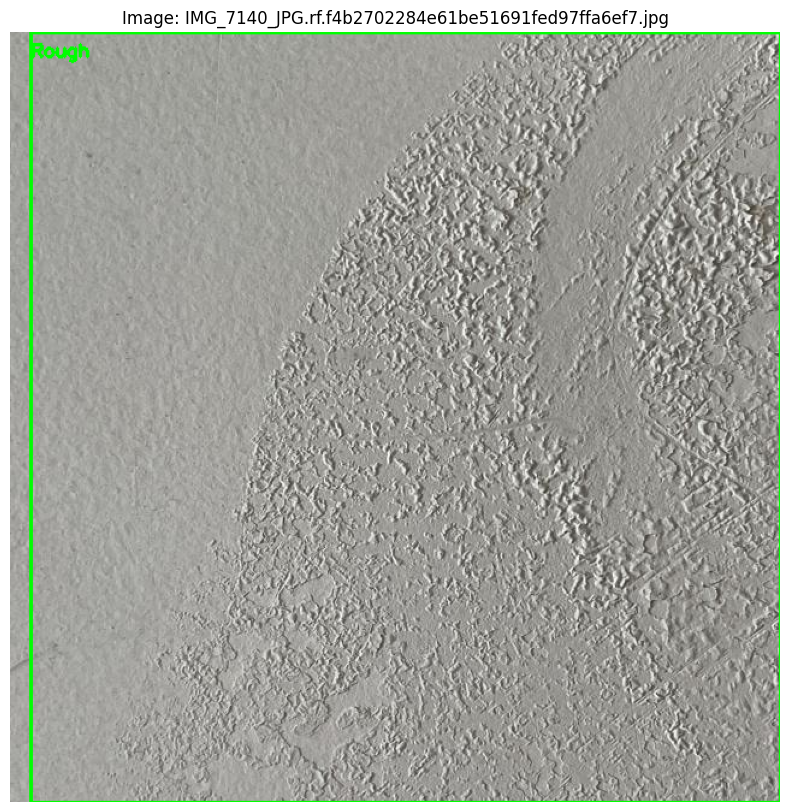


image 1/1 /kaggle/input/wall-dataset/test/20240122_102810_003_saved-1-_jpg.rf.814fddd52168b6ff41f2ceeb03f79be2.jpg: 640x640 1 Rough Wall, 17.8ms
Speed: 1.8ms preprocess, 17.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


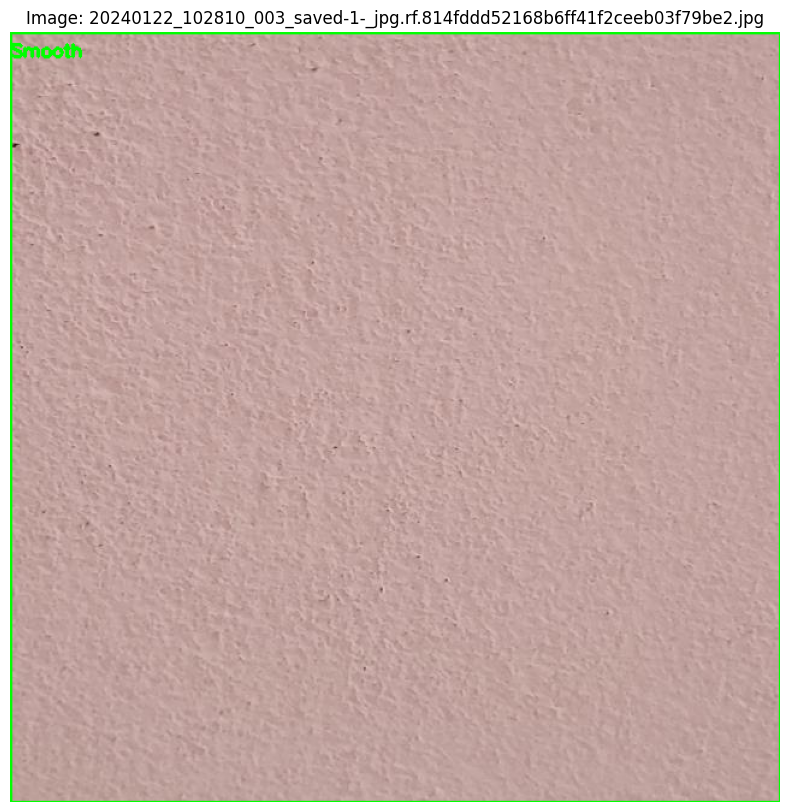


image 1/1 /kaggle/input/wall-dataset/test/20240122_102229_002_saved_jpg.rf.1b172bbb482bfedff5d3d13373623185.jpg: 640x640 1 Smooth Wall, 17.8ms
Speed: 1.7ms preprocess, 17.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


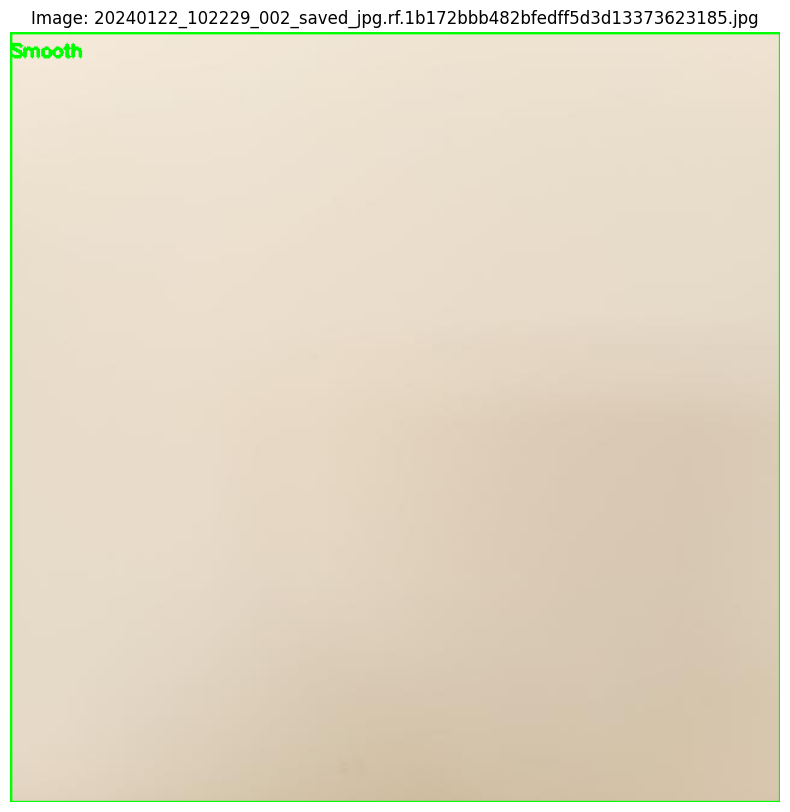


image 1/1 /kaggle/input/wall-dataset/test/20240122_101903_jpg.rf.99aad4258d124925de88669fcceadeca.jpg: 640x640 1 Rough Wall, 17.7ms
Speed: 1.6ms preprocess, 17.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


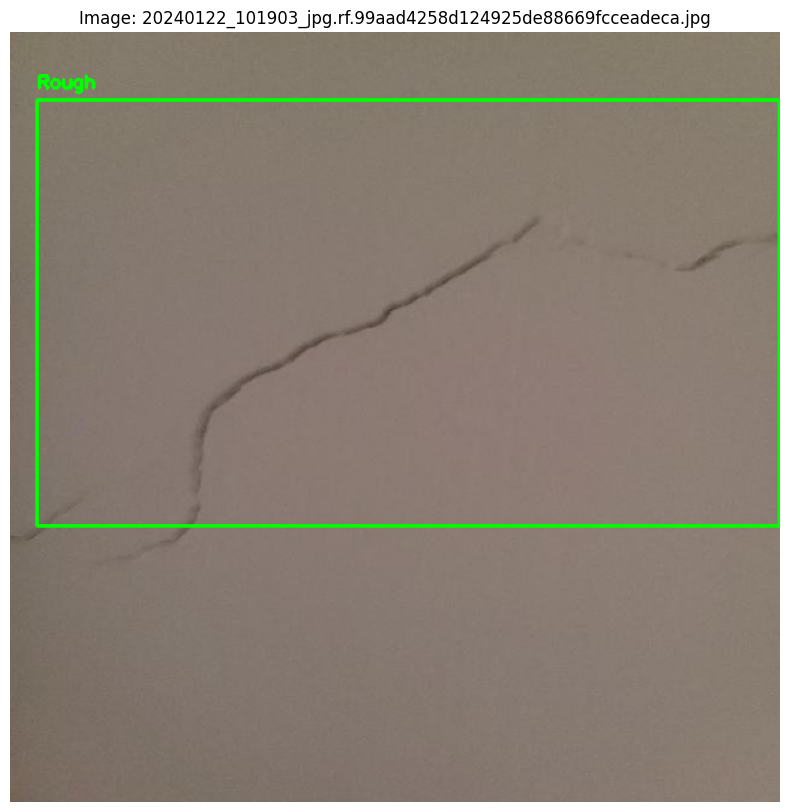


image 1/1 /kaggle/input/wall-dataset/test/20240122_102810_005_saved-1-_jpg.rf.cc751831da2d95cb52e61be6b3aeca3f.jpg: 640x640 1 Rough Wall, 17.8ms
Speed: 1.7ms preprocess, 17.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


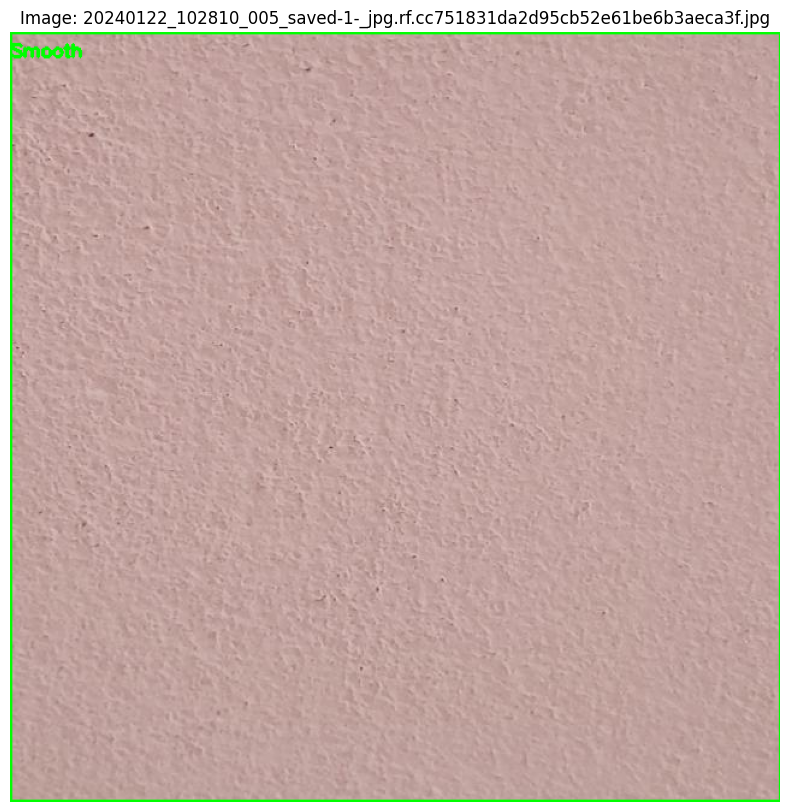


image 1/1 /kaggle/input/wall-dataset/test/20240122_103720_jpg.rf.bce5266a6a5181088e4790018786b06b.jpg: 640x640 1 Rough Wall, 17.7ms
Speed: 1.8ms preprocess, 17.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


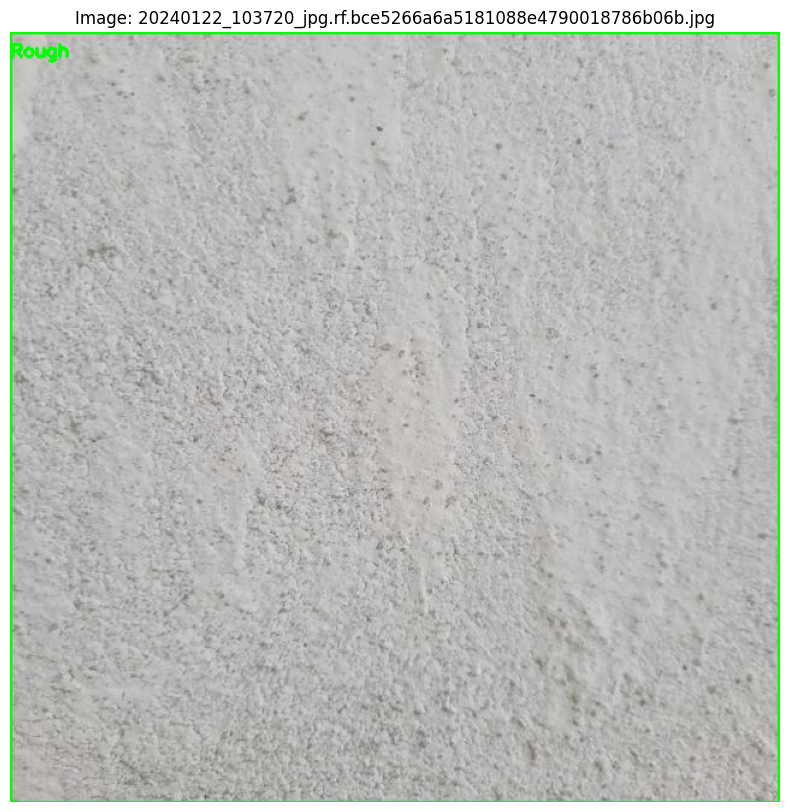


image 1/1 /kaggle/input/wall-dataset/test/20240122_101914_jpg.rf.0b980054143a41916fa836a96654922d.jpg: 640x640 1 Smooth Wall, 18.0ms
Speed: 1.9ms preprocess, 18.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


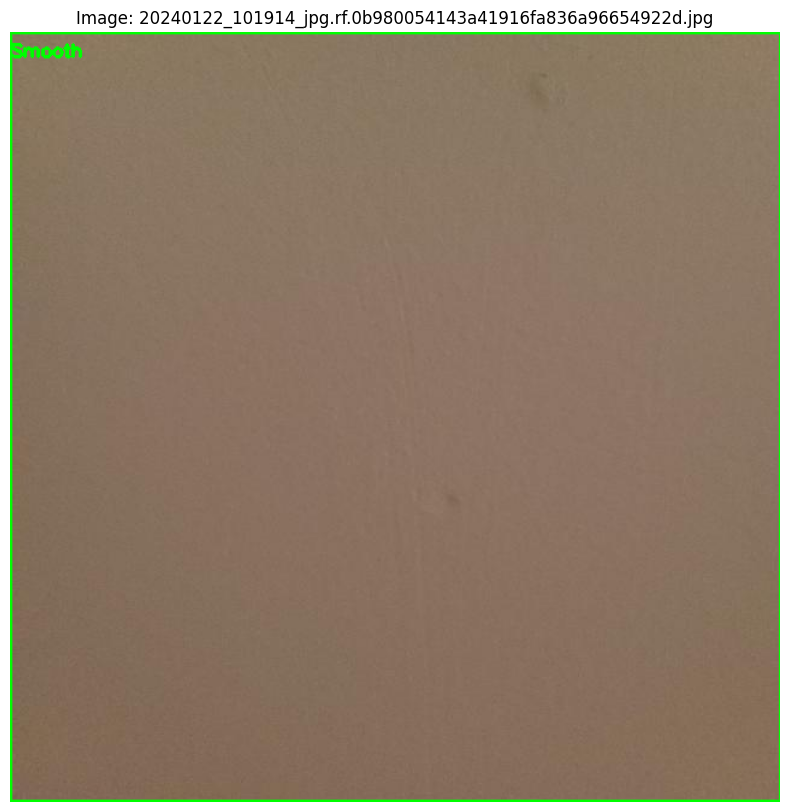


image 1/1 /kaggle/input/wall-dataset/test/20240122_102205_jpg.rf.7e014af095b52a00598f271c2e9d819f.jpg: 640x640 1 Rough Wall, 17.8ms
Speed: 1.6ms preprocess, 17.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


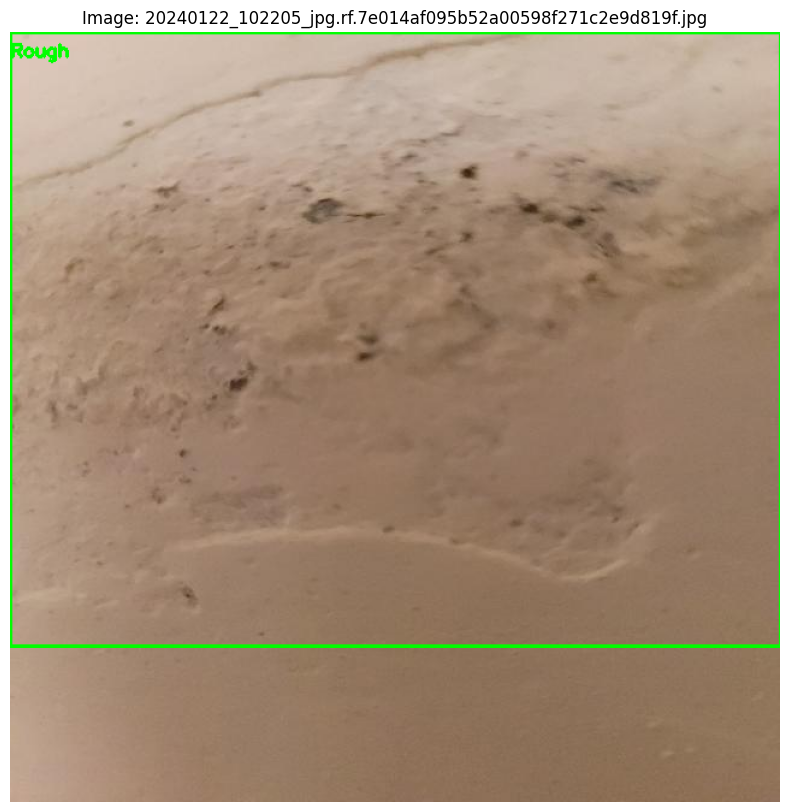


image 1/1 /kaggle/input/wall-dataset/test/20240122_102135_008_saved_jpg.rf.aa732a313df5abad10dfcde0b6f10f0f.jpg: 640x640 1 Smooth Wall, 17.7ms
Speed: 1.8ms preprocess, 17.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


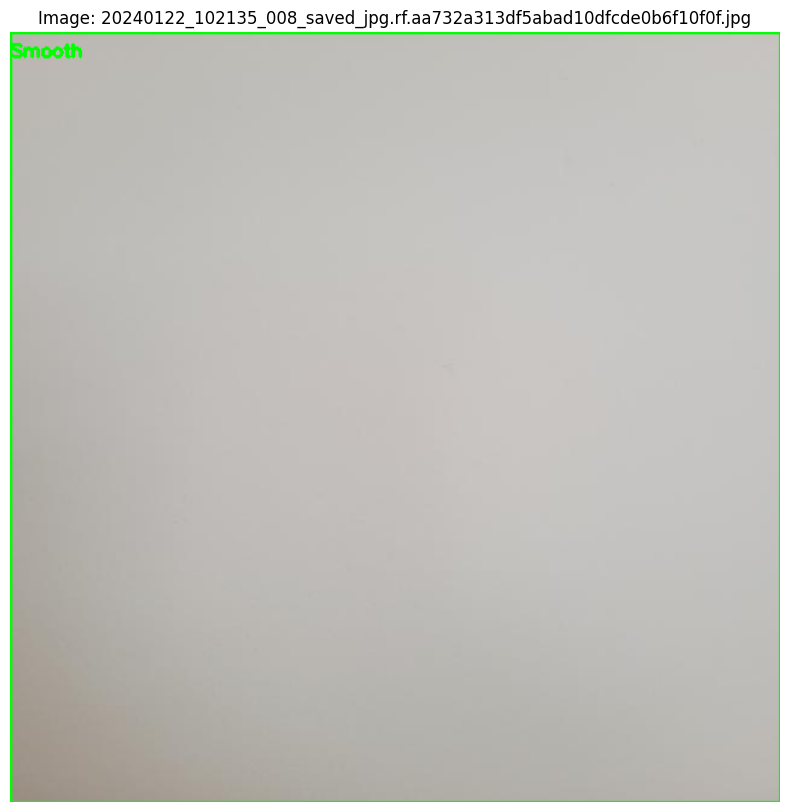


image 1/1 /kaggle/input/wall-dataset/test/IMG_7065_JPG.rf.bae28649e9fd4dda8e12b4d1c029a0f1.jpg: 640x640 2 Rough Walls, 17.8ms
Speed: 1.8ms preprocess, 17.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


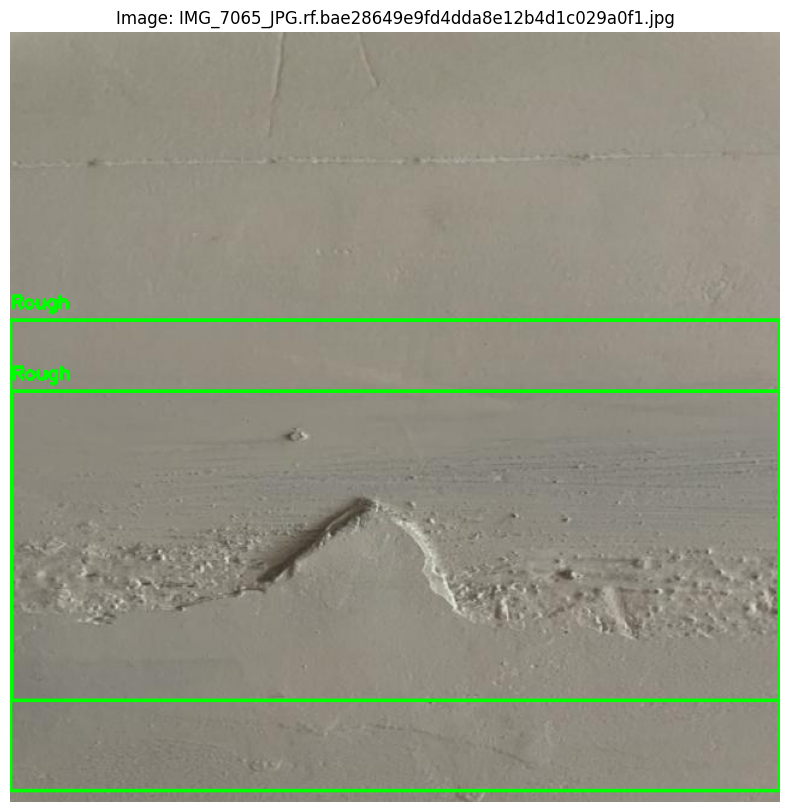

In [24]:
import os
import json
import cv2
import numpy as np
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Custom Dataset Class for Cropped Images
class CroppedWallSurfaceDataset(Dataset):
    def __init__(self, image_dir, annotation_file, transform=None):
        """
        Dataset class for cropped images based on bounding box annotations.

        Args:
            image_dir (str): Directory containing images.
            annotation_file (str): Path to COCO-style annotation file.
            transform: Transformations to apply to cropped images.
        """
        self.image_dir = image_dir
        self.annotations = json.load(open(annotation_file, 'r'))
        self.image_info = {img['id']: img['file_name'] for img in self.annotations['images']}
        self.transform = transform
        self.class_names = {1: "Rough", 2: "Smooth"}  # Class names mapping

        # Prepare list of cropped images and labels
        self.cropped_images = []
        self.labels = []

        for ann in self.annotations['annotations']:
            if ann['category_id'] in [1, 2]:  # Only consider relevant categories
                image_id = ann['image_id']
                image_path = os.path.join(self.image_dir, self.image_info[image_id])
                image = cv2.imread(image_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                # Get bounding box coordinates
                x, y, width, height = ann['bbox']
                x, y, width, height = int(x), int(y), int(width), int(height)

                # Crop the image using the bounding box
                cropped_image = image[y:y + height, x:x + width]
                if cropped_image.size == 0:  # Skip invalid crops
                    continue

                # Resize the cropped image to a fixed size
                cropped_image = cv2.resize(cropped_image, (224, 224))

                # Append the cropped image and label
                self.cropped_images.append(cropped_image)
                self.labels.append(0 if ann['category_id'] == 1 else 1)  # 0: Rough, 1: Smooth

    def __len__(self):
        return len(self.cropped_images)  # Total number of cropped images

    def __getitem__(self, idx):
        image = self.cropped_images[idx]
        label = self.labels[idx]

        # Apply transformations if provided
        if self.transform:
            image = self.transform(image)

        return image, label

# Custom Model Class using ResNet18 as backbone
class WallSurfaceNet(nn.Module):
    def __init__(self, num_classes=2):
        super().__init__()
        # Load pretrained ResNet18
        resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

        # Freeze initial layers
        for param in resnet.parameters():
            param.requires_grad = False

        # Unfreeze later layers for fine-tuning
        for param in list(resnet.parameters())[-20:]:
            param.requires_grad = True

        # Feature extractor
        self.features = nn.Sequential(*list(resnet.children())[:-1])

        # Custom classifier with regularization
        self.classifier = nn.Sequential(
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        features = self.features(x)
        features = features.view(features.size(0), -1)
        return self.classifier(features)

# Function to train and evaluate the model
def train_and_evaluate(train_dataset, val_dataset):
    # Data augmentation for training
    train_transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.RandomRotation(20),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    # Transformations for validation
    val_transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    # Apply transformations to datasets
    train_dataset.transform = train_transform
    val_dataset.transform = val_transform

    # Data loaders
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, drop_last=True)
    val_loader = DataLoader(val_dataset, batch_size=32)

    # Device setup (GPU if available)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = WallSurfaceNet().to(device)

    # Optimizer with weight decay
    optimizer = optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
    criterion = nn.CrossEntropyLoss()  # Cross-entropy loss for classification
    scheduler = ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5)  # Learning rate scheduler

    # Training loop
    for epoch in range(15):  # Reduced epochs for demonstration
        model.train()
        train_loss, train_correct, train_total = 0, 0, 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            train_total += labels.size(0)
            train_correct += (predicted == labels).sum().item()

        # Validation
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()

                _, predicted = torch.max(outputs, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        # Print metrics
        print(f"Epoch {epoch+1}: Train Loss {train_loss/train_total:.4f}, Train Acc {100*train_correct/train_total:.2f}%, "
              f"Val Loss {val_loss/val_total:.4f}, Val Acc {100*val_correct/val_total:.2f}%")

    return model  # Return the trained model

# Function to predict and visualize bounding boxes with labels
def predict_and_visualize(model, yolo_model, test_images_path):
    """
    Predicts bounding boxes using YOLO, crops the regions, classifies them using the trained model,
    and visualizes the results.

    Args:
        model: Trained classification model.
        yolo_model: Pretrained YOLO model for bounding box prediction.
        test_images_path (str): Path to the test images folder.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()

    # Iterate over test images
    for image_file in os.listdir(test_images_path):
        if not image_file.endswith(('.jpg', '.png', '.jpeg')):
            continue

        # Load the test image
        image_path = os.path.join(test_images_path, image_file)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Get predictions from YOLO model
        results = yolo_model(image_path)
        predictions = results[0].boxes.xyxy.cpu().numpy()  # Predicted bounding boxes in [x_min, y_min, x_max, y_max] format

        # Draw bounding boxes and classify each cropped region
        for box in predictions:
            x_min, y_min, x_max, y_max = map(int, box)
            cropped_image = image[y_min:y_max, x_min:x_max]

            if cropped_image.size == 0:  # Skip invalid crops
                continue

            # Preprocess the cropped image
            cropped_image = cv2.resize(cropped_image, (224, 224))
            cropped_image = transforms.ToTensor()(cropped_image).unsqueeze(0).to(device)

            # Predict the label for the cropped region
            with torch.no_grad():
                outputs = model(cropped_image)
                _, predicted = torch.max(outputs, 1)
                label = "Smooth" if predicted.item() == 1 else "Rough"

            # Draw the bounding box and label on the original image
            cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)  # Green box

            # Adjust label position to ensure it stays inside the image
            text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)[0]
            text_x = x_min
            text_y = y_min - 10 if y_min - 10 > 10 else y_min + 20  # Move label inside if it goes out of bounds
            cv2.putText(image, label, (text_x, text_y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        # Display the image with bounding boxes and labels
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Image: {image_file}")
        plt.show()

# Dataset paths
base_dir = '/kaggle/input/wall-dataset'

train_dataset = CroppedWallSurfaceDataset(
    image_dir=os.path.join(base_dir, 'train'),
    annotation_file=os.path.join(base_dir, 'train/_annotations.coco.json')
)

val_dataset = CroppedWallSurfaceDataset(
    image_dir=os.path.join(base_dir, 'valid'),
    annotation_file=os.path.join(base_dir, 'valid/_annotations.coco.json')
)

# Train the model
trained_model = train_and_evaluate(train_dataset, val_dataset)

# Load YOLO model for bounding box prediction
yolo_model = YOLO("runs/detect/fine_tuned_yolo/weights/best.pt")

# Predict and visualize bounding boxes for test images
test_images_path = os.path.join(base_dir, 'test')
predict_and_visualize(trained_model, yolo_model, test_images_path)

This code trains a ResNet18-based model to classify cropped wall surface images as "Rough" or "Smooth" using a custom dataset with COCO-style annotations. It uses YOLO for bounding box detection, crops the detected regions, and classifies them using the trained model. Finally, it visualizes the bounding boxes and predicted labels on test images.


image 1/1 /kaggle/input/wall-dataset/test/20240122_101903_jpg.rf.99aad4258d124925de88669fcceadeca.jpg: 640x640 1 Rough Wall, 17.7ms
Speed: 2.0ms preprocess, 17.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


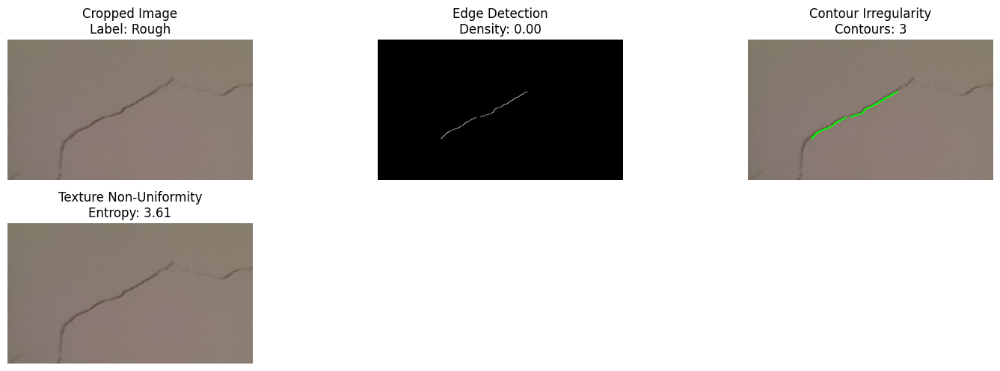


image 1/1 /kaggle/input/wall-dataset/test/20240122_102135_009_saved_jpg.rf.5e13942a261b93734668ac023f5eafa1.jpg: 640x640 1 Smooth Wall, 17.7ms
Speed: 1.7ms preprocess, 17.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


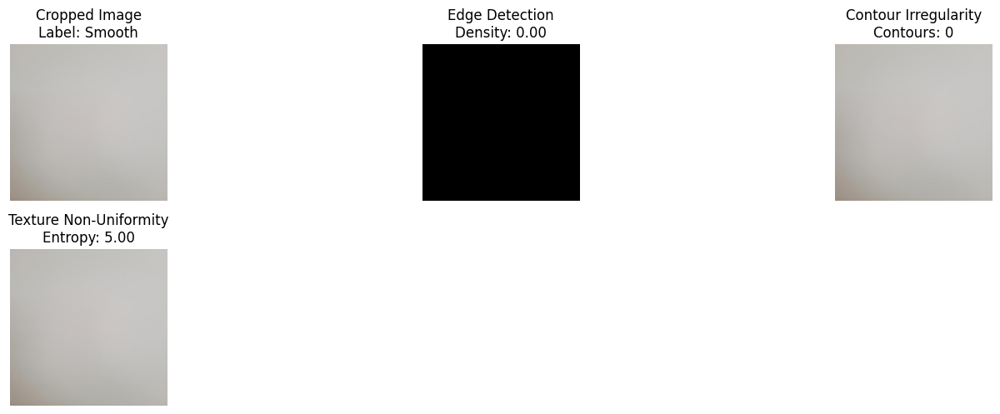


image 1/1 /kaggle/input/wall-dataset/test/IMG_7084_JPG.rf.6ba10ff04765fcb7813d17737ac46f5b.jpg: 640x640 1 Rough Wall, 17.8ms
Speed: 1.7ms preprocess, 17.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


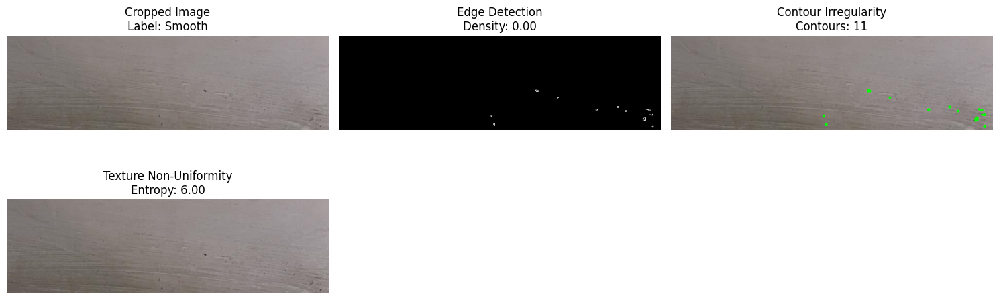


image 1/1 /kaggle/input/wall-dataset/test/20240122_101914_jpg.rf.0b980054143a41916fa836a96654922d.jpg: 640x640 1 Smooth Wall, 17.8ms
Speed: 2.1ms preprocess, 17.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


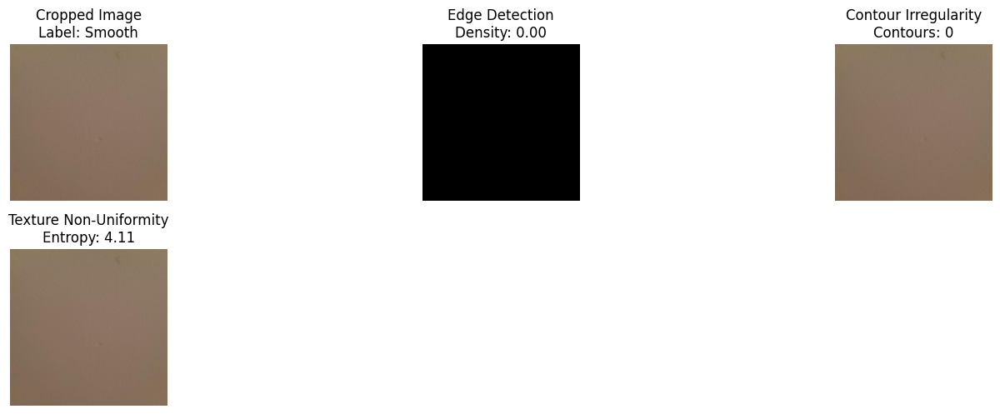


image 1/1 /kaggle/input/wall-dataset/test/IMG_7090_JPG.rf.da4cb3da033cd9070dffdac4938bb646.jpg: 640x640 1 Rough Wall, 1 Smooth Wall, 17.8ms
Speed: 1.7ms preprocess, 17.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


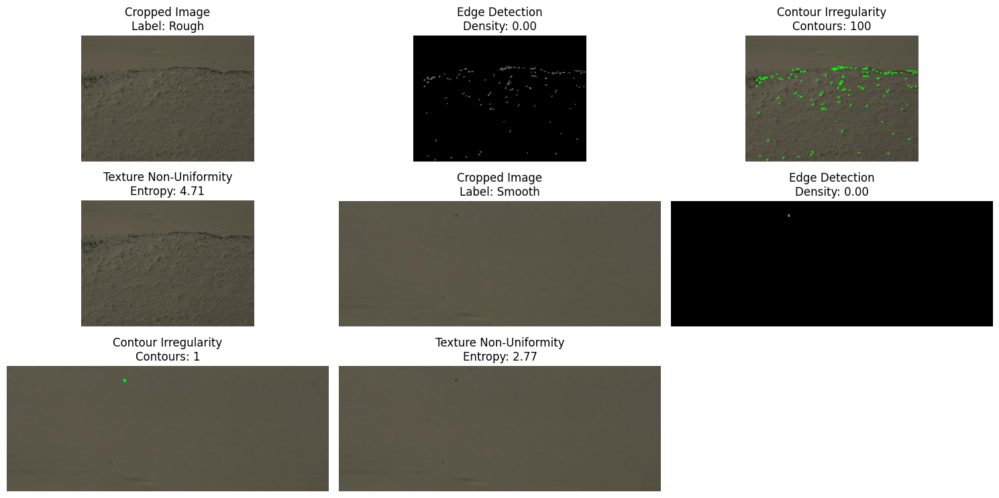

In [27]:
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from ultralytics import YOLO
import matplotlib.pyplot as plt
import random

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Function to calculate edge density using Canny edge detection
def calculate_edge_density(image):
    """
    Calculates the edge density of an image using Canny edge detection.

    Args:
        image (numpy.ndarray): Input image.

    Returns:
        float: Edge density (ratio of edge pixels to total pixels).
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 100, 200)
    edge_density = np.sum(edges > 0) / (image.shape[0] * image.shape[1])
    return edge_density

# Function to calculate contour irregularity
def calculate_contour_irregularity(image):
    """
    Calculates the contour irregularity of an image.

    Args:
        image (numpy.ndarray): Input image.

    Returns:
        tuple: Number of contours and the contour plot.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 100, 200)
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour_plot = cv2.drawContours(image.copy(), contours, -1, (0, 255, 0), 2)  # Draw contours on the image
    return len(contours), contour_plot

# Function to calculate texture non-uniformity using entropy
def calculate_texture_non_uniformity(image):
    """
    Calculates the texture non-uniformity of an image using entropy.

    Args:
        image (numpy.ndarray): Input image.

    Returns:
        float: Texture non-uniformity (entropy).
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    hist = cv2.calcHist([gray], [0], None, [256], [0, 256])
    hist = hist / hist.sum()  # Normalize histogram
    entropy = -np.sum(hist * np.log2(hist + 1e-10))  # Add small epsilon to avoid log(0)
    return entropy

# Function to predict and visualize bounding boxes with filters
def predict_and_visualize_with_filters(model, yolo_model, test_images_path, num_images=5):
    """
    Predicts bounding boxes using YOLO, crops the regions, applies filters, and visualizes the results.

    Args:
        model: Trained classification model.
        yolo_model: Pretrained YOLO model for bounding box prediction.
        test_images_path (str): Path to the test images folder.
        num_images (int): Number of images to process and display.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()

    # Get a list of all test images
    test_images = [os.path.join(test_images_path, img) for img in os.listdir(test_images_path) if img.endswith(('.jpg', '.png', '.jpeg'))]

    # Randomly select 5 images
    selected_images = random.sample(test_images, num_images)

    # Iterate over the selected images
    for image_path in selected_images:
        # Load the test image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Get predictions from YOLO model
        results = yolo_model(image_path)
        predictions = results[0].boxes.xyxy.cpu().numpy()  # Predicted bounding boxes in [x_min, y_min, x_max, y_max] format

        # Create a figure to display results
        plt.figure(figsize=(15, 10))

        # Draw bounding boxes and classify each cropped region
        for i, box in enumerate(predictions):
            x_min, y_min, x_max, y_max = map(int, box)
            cropped_image = image[y_min:y_max, x_min:x_max]

            if cropped_image.size == 0:  # Skip invalid crops
                continue

            # Preprocess the cropped image
            cropped_image_resized = cv2.resize(cropped_image, (224, 224))
            cropped_image_tensor = transforms.ToTensor()(cropped_image_resized).unsqueeze(0).to(device)

            # Predict the label for the cropped region
            with torch.no_grad():
                outputs = model(cropped_image_tensor)
                _, predicted = torch.max(outputs, 1)
                label = "Smooth" if predicted.item() == 1 else "Rough"

            # Apply filters to the cropped image
            edge_density = calculate_edge_density(cropped_image)
            contour_irregularity, contour_plot = calculate_contour_irregularity(cropped_image)
            texture_non_uniformity = calculate_texture_non_uniformity(cropped_image)

            # Display the original cropped image
            plt.subplot(4, 3, i * 4 + 1)
            plt.imshow(cropped_image)
            plt.title(f"Cropped Image\nLabel: {label}")
            plt.axis('off')

            # Display edge detection
            edges = cv2.Canny(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY), 100, 200)
            plt.subplot(4, 3, i * 4 + 2)
            plt.imshow(edges, cmap='gray')
            plt.title(f"Edge Detection\nDensity: {edge_density:.2f}")
            plt.axis('off')

            # Display contour plot
            plt.subplot(4, 3, i * 4 + 3)
            plt.imshow(contour_plot)
            plt.title(f"Contour Irregularity\nContours: {contour_irregularity}")
            plt.axis('off')

            # Display texture non-uniformity (entropy)
            plt.subplot(4, 3, i * 4 + 4)
            plt.imshow(cropped_image)
            plt.title(f"Texture Non-Uniformity\nEntropy: {texture_non_uniformity:.2f}")
            plt.axis('off')

        plt.tight_layout()
        plt.show()

# Dataset paths
base_dir = '/kaggle/input/wall-dataset'

# Load YOLO model for bounding box prediction
yolo_model = YOLO("runs/detect/fine_tuned_yolo/weights/best.pt")

# Predict and visualize bounding boxes with filters for 5 test images
test_images_path = os.path.join(base_dir, 'test')
predict_and_visualize_with_filters(trained_model, yolo_model, test_images_path, num_images=5)

This code uses YOLO to detect bounding boxes in test images, crops the regions, and applies filters (edge density, contour irregularity, texture non-uniformity) to analyze and classify them as "Rough" or "Smooth" using a trained model. It visualizes the results with filters for better understanding.